In [1]:
#Needed in general


import numpy as np
import matplotlib.pyplot as plt
import sys
import h5py as h5
import gc

#Quick fudge to make import from ../Scripts work
sys.path.append('../Scripts')

#Custom imports
# import ClassCOMPAS     as CC ###
# import ClassFormationChannels as FC a


# import script that has formation channel classification functions:
from PostProcessingScripts import * 
# from ClassFormationChannels_5mainchannels import * 



from astropy import units as u
from astropy import constants as const

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
# print(fs)

import astropy
import seaborn as sns
from seaborn_utility import cmap_from_colour

from astropy import units as u
from astropy import constants as c

changed 3


In [ ]:
# Mass Ratio vs X_eff (Fig 21) 

In [2]:






def plot_Fig_GWTC(xparam='chiEff', BPSmodelName='A', mssfr='112'):
    
    labellist= np.ones(5) #,  r'$\log_{10}(t) $']      
    fig, axe = plt.subplots(1,1, figsize=(12,10),\
                           gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1]})

    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    massCO_ZAMSM1 = fdata['doubleCompactObjects']['M1'][...].squeeze()
    massCO_ZAMSM2 = fdata['doubleCompactObjects']['M2'][...].squeeze()
    # M1 will be the most massive, M2 the least massive compact object. 
    massCO_LVKM1, massCO_LVKM2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
#     Chirpmass = chirpmass(M1, M2)
    MassRatioCO_LVK = massCO_LVKM2/massCO_LVKM1

    ### FOR SPIN ###
#     seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
#     seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
#     # get only SN seeds for DCOs 
#     maskSNdco = np.in1d(seedsSN,  seedsDCO) 
#     whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
#     whichSN1 = whichSN[::2] # get whichStar for first SN 
    

#     separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
#     separationPreSN2 = separationPreSN[1::2] # in Rsun. 
#     MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[maskSNdco][1::2]  
    
#     # the second SN is the most massive BH 
#     maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
#     mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
#     mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
#     print('nr of weird reversals = %s'%np.sum(mask_temp))
#     print('nr of normal reversals = %s'%np.sum(mask_2))
    
#     spinBH = QinBHspinmodel(separationPreSN2, M1, M2, np.ones_like(M1))    
     
        
    spin = COspin(data_path=path, state='he_depletion')  # set class 
    spin.setCOMPASData() # reads in the COMPAS DCO parameters 
    spinZAMSM1, spinZAMSM2  = spin.BaveraSpin() #ZAMS M1 SPIN 
    
    
    maxSpinBBH = np.maximum(spinZAMSM1,spinZAMSM2)
    mask_ = (maxSpinBBH >0)
    print('\t non-zero spin:', np.sum(mask_), 'out of ', len(mask_), 'BBHs')
    mask_ = (maxSpinBBH >0.2)
    print('\t a spin >.2: ', np.sum(mask_), 'out of ', len(mask_), 'BBHs')
    
    mask_MRR = (massCO_ZAMSM1/massCO_ZAMSM2) < 1
    mask_muchMRR = (massCO_ZAMSM1/massCO_ZAMSM2) < 0.9  


    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    weights_ = fdata[fparam_key][weightheader][...].squeeze()
    w = weights_
    
    

    fs_l = 20 # label fontsize
    


    if xparam=='ChiEff_vs_q':
        axe.set_xlim(-1, 1)
        axe.set_ylim(0, 1)  
        chi_eff = ((spinZAMSM1 *massCO_ZAMSM1) + spinZAMSM2*massCO_ZAMSM2) / (massCO_ZAMSM1+massCO_ZAMSM2)
        param_x = chi_eff
        param_y = MassRatioCO_LVK
        nameX = r'$\chi_{\rm{eff}}$'
        nameY = r'$q$'
 
        
    NN_ = 1000
    mask_nonZero = (chi_eff>0.1)
    print(chi_eff[mask_nonZero])
    size_ = 1000
#     axe.scatter(param_x[~mask_MRR][:NN_], param_y[~mask_MRR][:NN_], s=size_*w[~mask_MRR][:NN_], color='lightgray', zorder=1, label=r'no MRR') # all non MRR 
#     axe.scatter(param_x[mask_MRR][:NN_], param_y[mask_MRR][:NN_], s=size_*w[mask_MRR][:NN_], color='orange', zorder=2, label=r'MRR: $q < 1$') # all non MRR 
#     axe.scatter(param_x[mask_muchMRR][:NN_], param_y[mask_muchMRR][:NN_], s=size_*w[mask_muchMRR][:NN_], color='blue', zorder=3, label=r'MRR: $q < 0.9$') # all non MRR 
    axe.scatter(param_x[~mask_MRR][:], param_y[~mask_MRR][:], s=size_*w[~mask_MRR][:], color='lightgray', zorder=1, label=r'no MRR') # all non MRR 
    axe.scatter(param_x[mask_MRR][:], param_y[mask_MRR][:], s=size_*w[mask_MRR][:], color='orange', zorder=2, label=r'MRR: $q < 1$') # all non MRR 
    axe.scatter(param_x[mask_muchMRR][:], param_y[mask_muchMRR][:], s=size_*w[mask_muchMRR][:], color='blue', zorder=3, label=r'MRR: $q < 0.9$') # all non MRR 
    
#     axe.scatter(param_x[:NN_], param_y[:NN_], s=440*w[:NN_], color='lightgray', zorder=1)
#     axe.scatter(param_x, param_y, s=800*w, color='gray', zorder=1)
    
    axe = layoutAxes(axe, nameX=nameX, nameY=nameY, setMinor=True, labelpad=10, fontsize=fs_l+10)


    
    
    axe.text(0+0.009, 1-0.009, 'model %s%s \n %s'%(BPSmodelName,mssfr,alphabetPhysicalNameDict[BPSmodelName]) , rotation = 0, fontsize = fs+8, color = 'k', ha = 'left', va='top', transform=axe.transAxes, zorder=100)#, weight = 'bold')
    
    plt.legend(fontsize=fs_l, loc=3)
    
    plt.grid(True)
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)#2)
    
    fig.tight_layout() 
    plt.savefig('./' + xparam + '_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
    plt.show()    
    
    return 









In [ ]:
# PLOT FIGURE 21 

using indices
this should be 3x the same: 8371398 8371398 8371398
0  still had negative spin; we set these to 0 
	 non-zero spin: 5228856 out of  8371398 BBHs
	 a spin >.2:  3905367 out of  8371398 BBHs
[0.32253369 0.2247504  0.14384706 ... 0.10631442 0.12276775 0.118181  ]


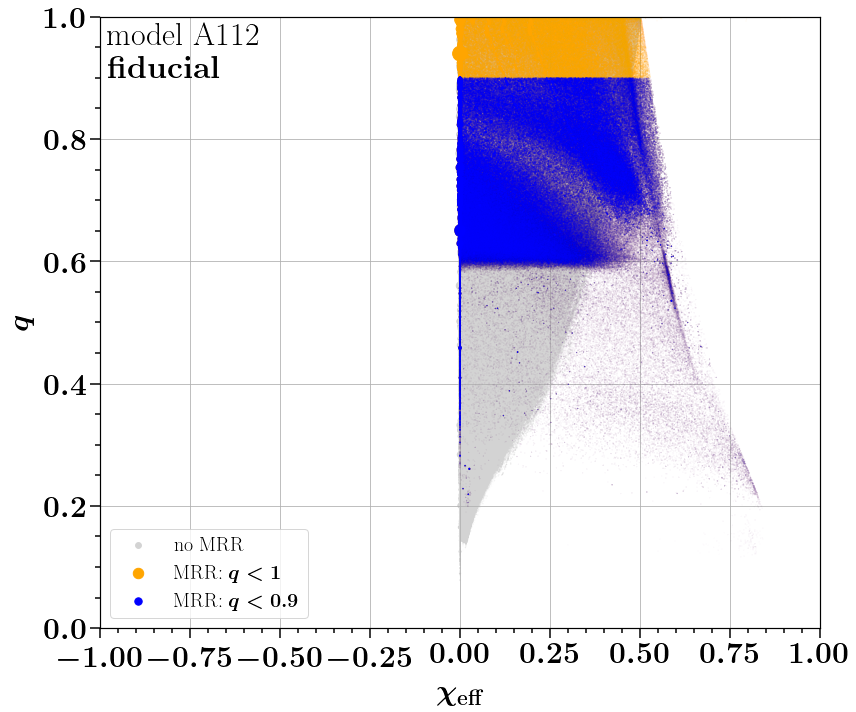

using indices
this should be 3x the same: 8616008 8616008 8616008
0  still had negative spin; we set these to 0 
	 non-zero spin: 7429825 out of  8616008 BBHs
	 a spin >.2:  6109485 out of  8616008 BBHs
[0.33406212 0.22217528 0.21245174 ... 0.1196817  0.10957673 0.14911921]


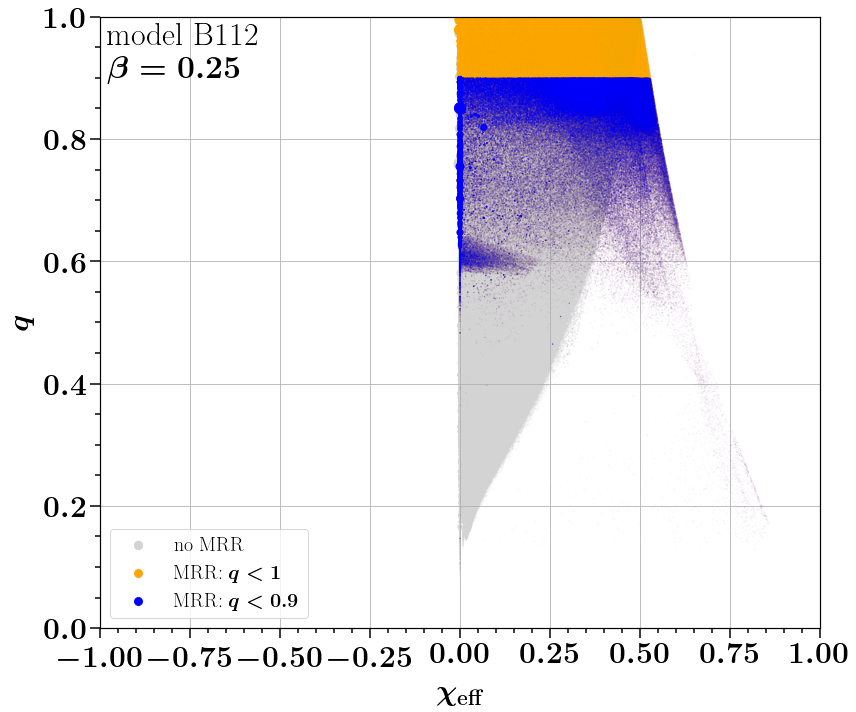

using indices
this should be 3x the same: 6568454 6568454 6568454
3  still had negative spin; we set these to 0 
	 non-zero spin: 4897679 out of  6568454 BBHs
	 a spin >.2:  4120254 out of  6568454 BBHs
[0.42562547 0.41271839 0.2341694  ... 0.12056202 0.14096916 0.20290156]


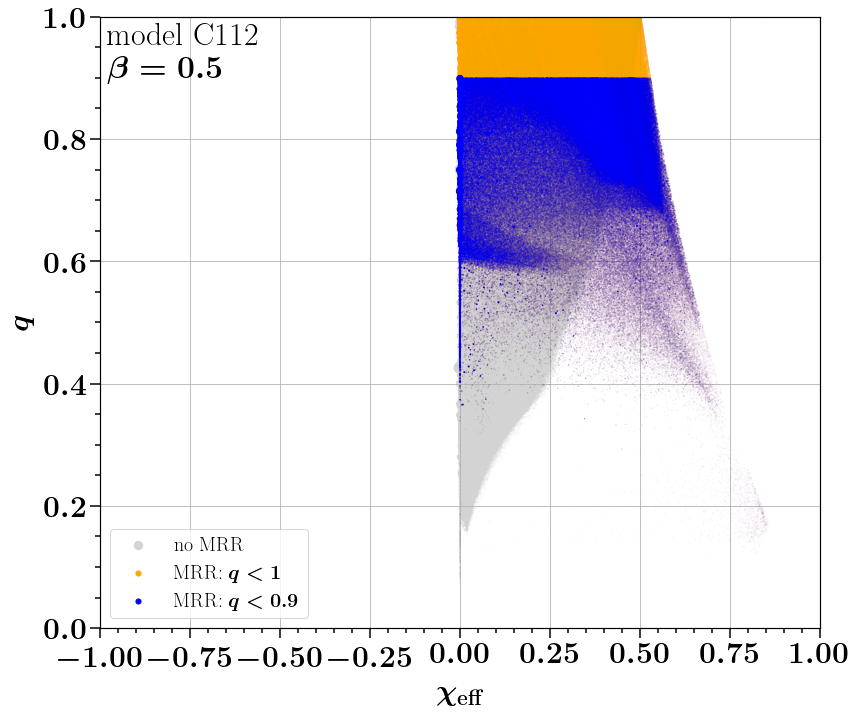

using indices
this should be 3x the same: 6033721 6033721 6033721
0  still had negative spin; we set these to 0 
	 non-zero spin: 3106682 out of  6033721 BBHs
	 a spin >.2:  2358652 out of  6033721 BBHs
[0.31140709 0.22418231 0.10889897 ... 0.12192047 0.11886469 0.11490328]


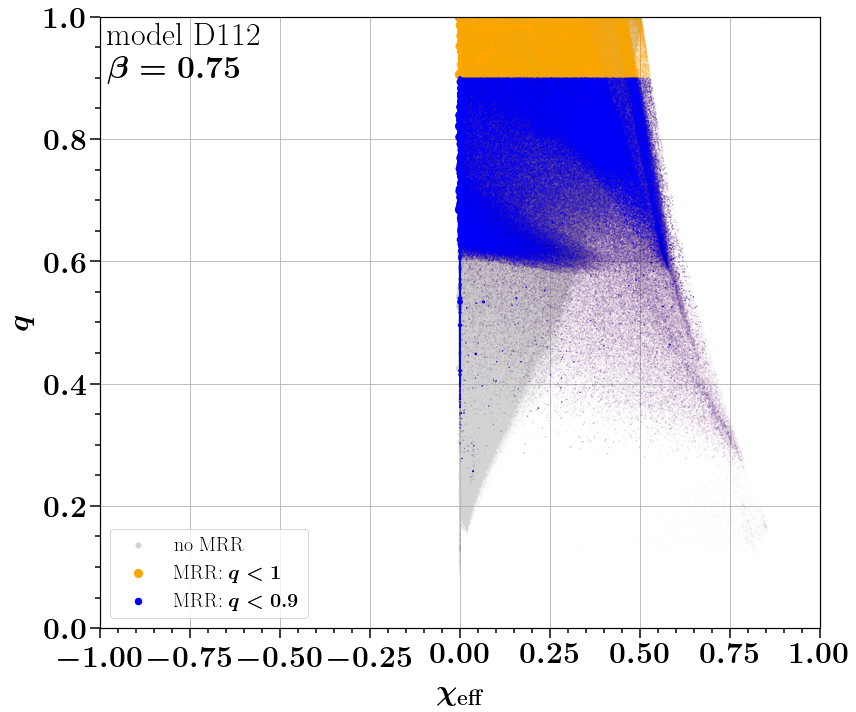

using indices
this should be 3x the same: 9274636 9274636 9274636
0  still had negative spin; we set these to 0 
	 non-zero spin: 5768476 out of  9274636 BBHs
	 a spin >.2:  4313648 out of  9274636 BBHs
[0.32253369 0.2247504  0.14384706 ... 0.11513662 0.10796454 0.12276775]


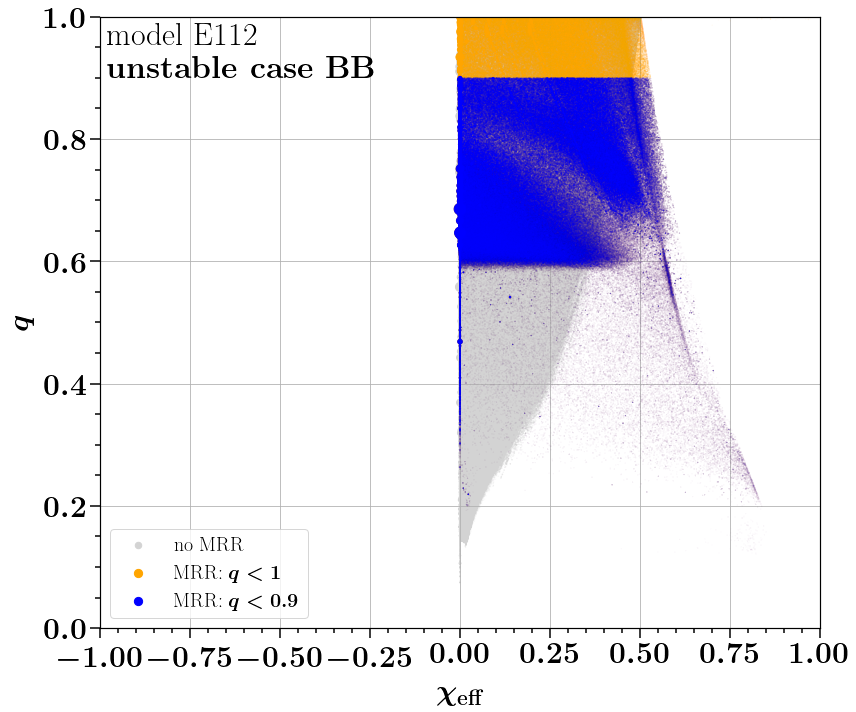

using indices
this should be 3x the same: 9782847 9782847 9782847
140  still had negative spin; we set these to 0 
	 non-zero spin: 6164708 out of  9782847 BBHs
	 a spin >.2:  4670311 out of  9782847 BBHs
[0.32253369 0.2247504  0.14384706 ... 0.13042501 0.12276775 0.10718868]


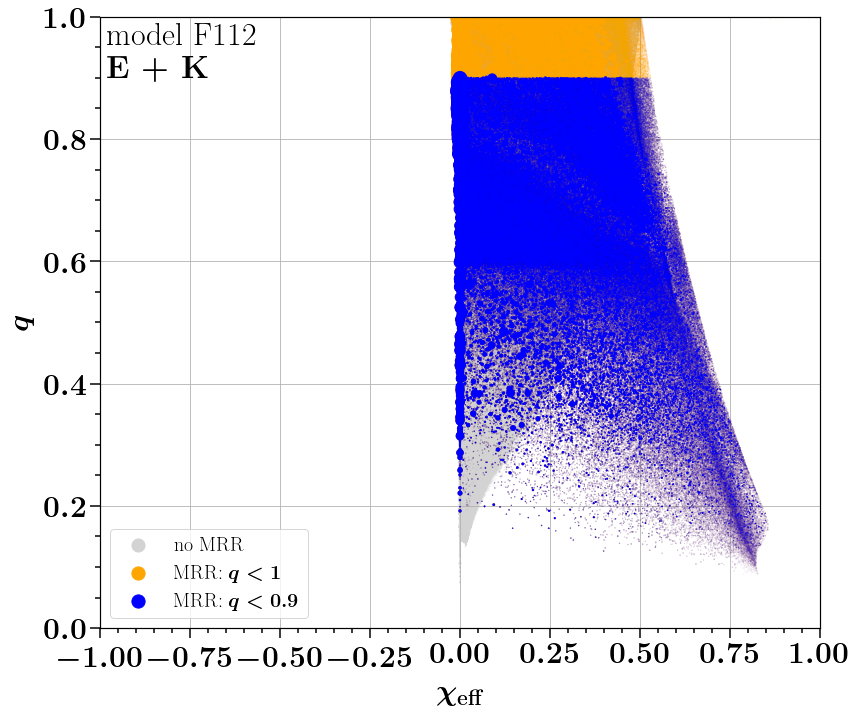

using indices
this should be 3x the same: 6338030 6338030 6338030
0  still had negative spin; we set these to 0 
	 non-zero spin: 1780455 out of  6338030 BBHs
	 a spin >.2:  1384802 out of  6338030 BBHs
[0.14384706 0.27581028 0.26671873 ... 0.11179449 0.13343436 0.11342123]


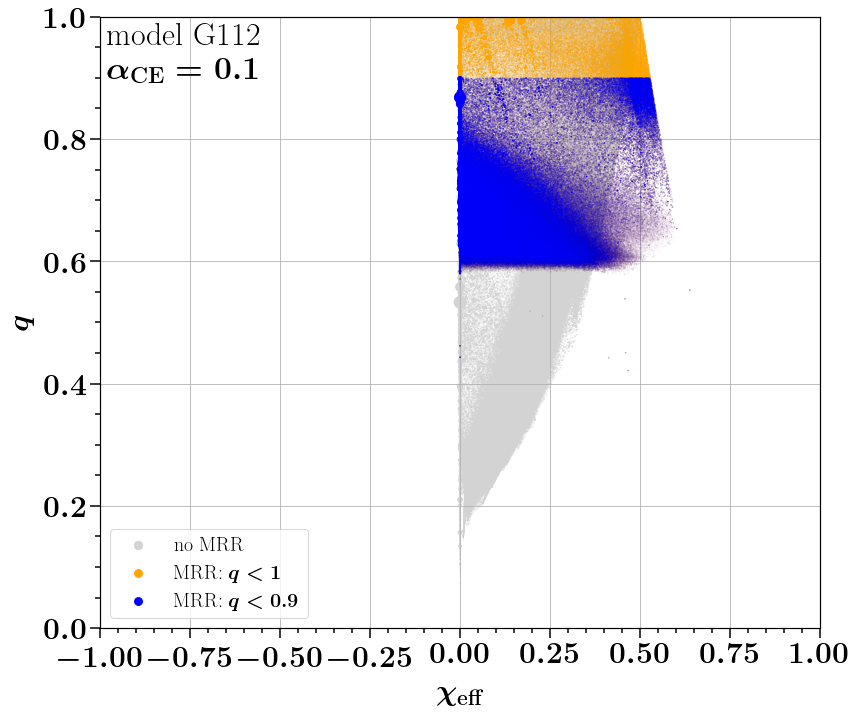

using indices
this should be 3x the same: 7958497 7958497 7958497
0  still had negative spin; we set these to 0 
	 non-zero spin: 3979199 out of  7958497 BBHs
	 a spin >.2:  3220770 out of  7958497 BBHs
[0.14384706 0.27812596 0.16317763 ... 0.10110197 0.11395984 0.11074006]


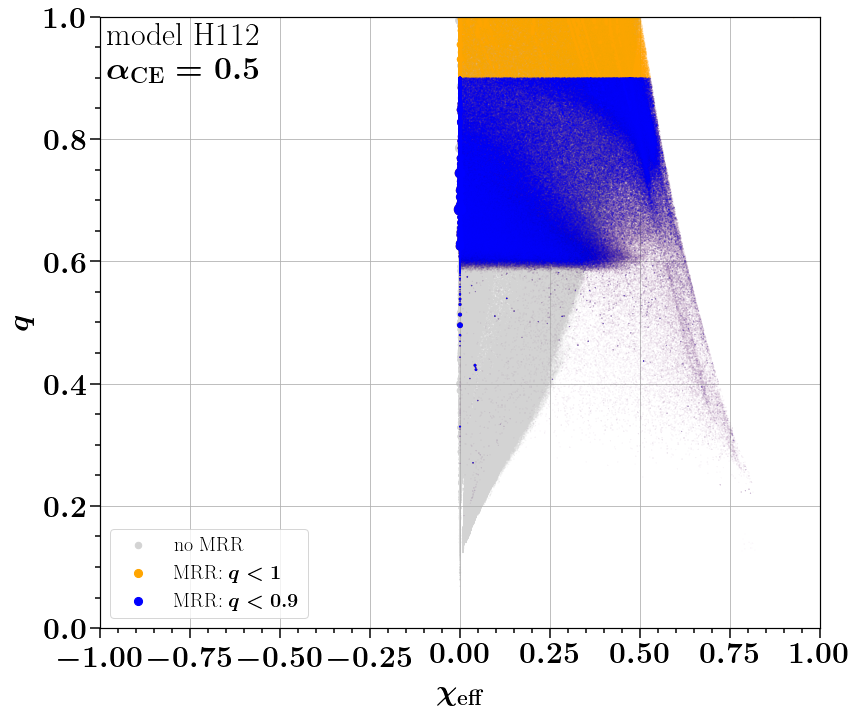

using indices
this should be 3x the same: 6212236 6212236 6212236
0  still had negative spin; we set these to 0 
	 non-zero spin: 3292965 out of  6212236 BBHs
	 a spin >.2:  1981579 out of  6212236 BBHs
[0.15817284 0.25329661 0.14846342 ... 0.11662993 0.1394629  0.17952176]


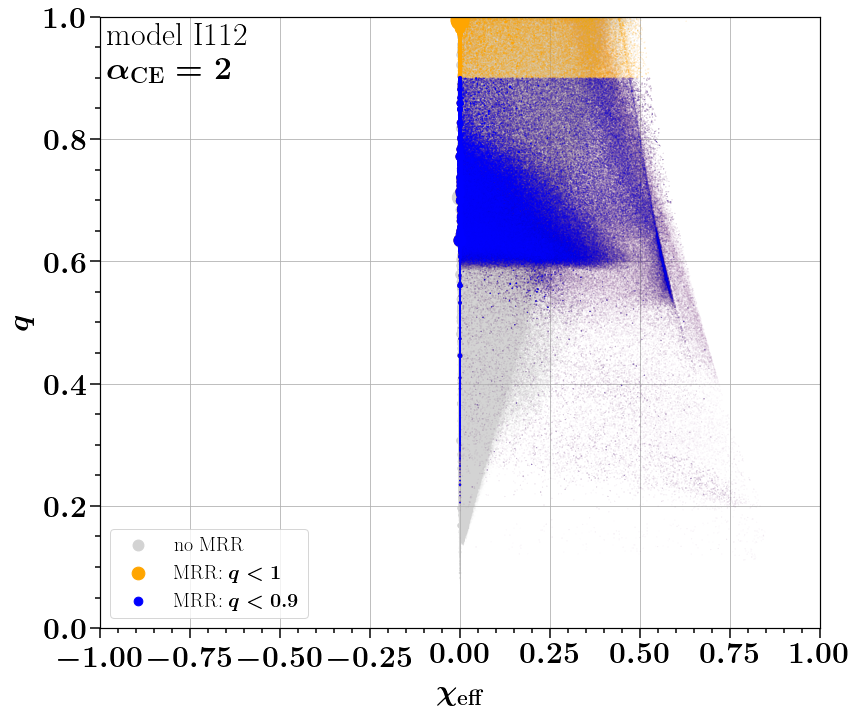

using indices
this should be 3x the same: 3514443 3514443 3514443
0  still had negative spin; we set these to 0 
	 non-zero spin: 604549 out of  3514443 BBHs
	 a spin >.2:  274924 out of  3514443 BBHs
[0.14384706 0.25636487 0.4039891  ... 0.11689234 0.10512133 0.12439793]


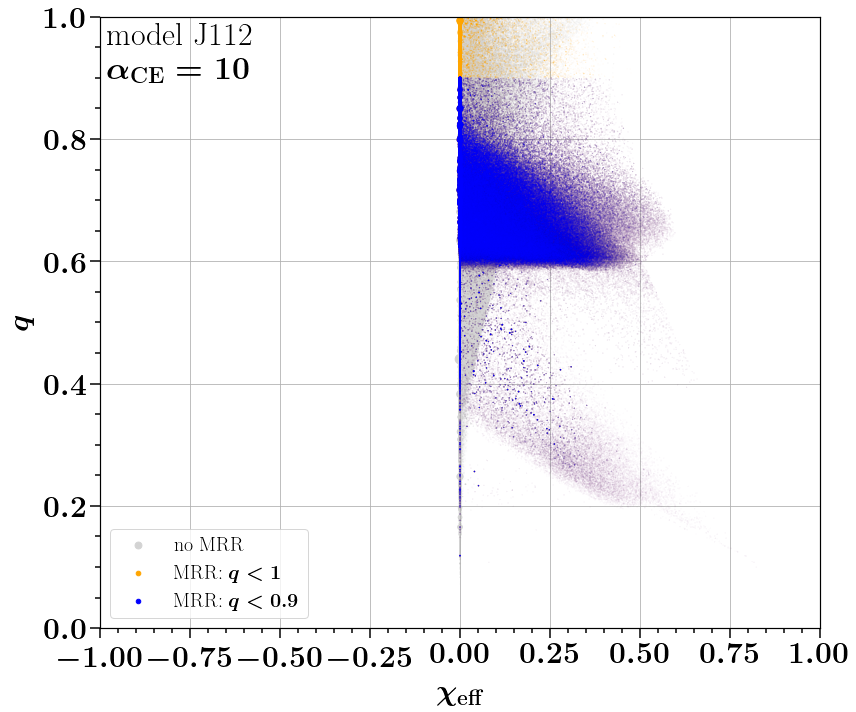

using indices
this should be 3x the same: 8782290 8782290 8782290
0  still had negative spin; we set these to 0 
	 non-zero spin: 5583001 out of  8782290 BBHs
	 a spin >.2:  4225522 out of  8782290 BBHs
[0.32253369 0.2247504  0.14384706 ... 0.1041578  0.10614085 0.10242344]


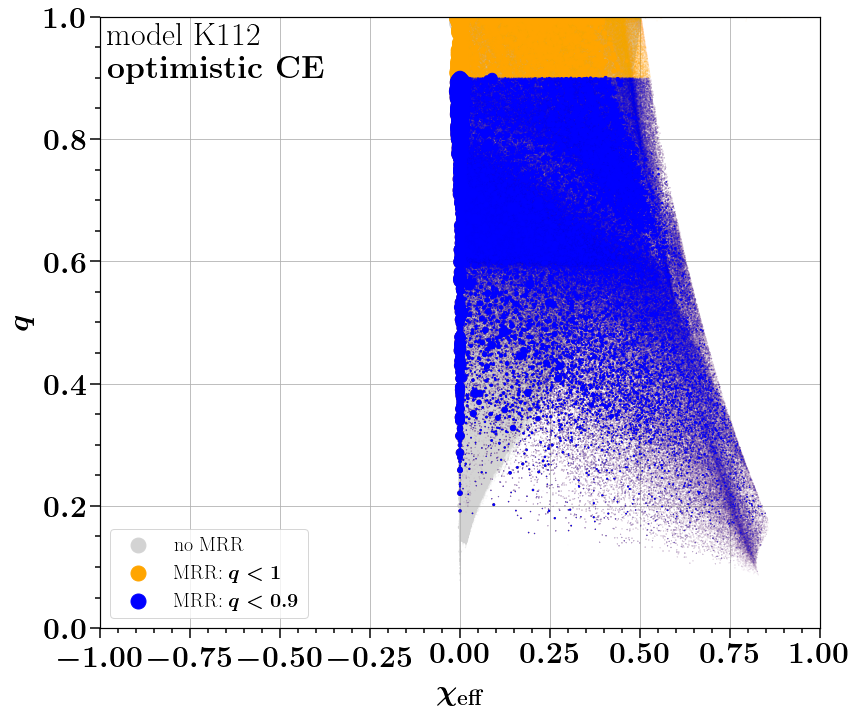

using indices
this should be 3x the same: 7463923 7463923 7463923
0  still had negative spin; we set these to 0 
	 non-zero spin: 4487675 out of  7463923 BBHs
	 a spin >.2:  3707782 out of  7463923 BBHs
[0.32253369 0.21957444 0.14384706 ... 0.10567448 0.10753217 0.11056926]


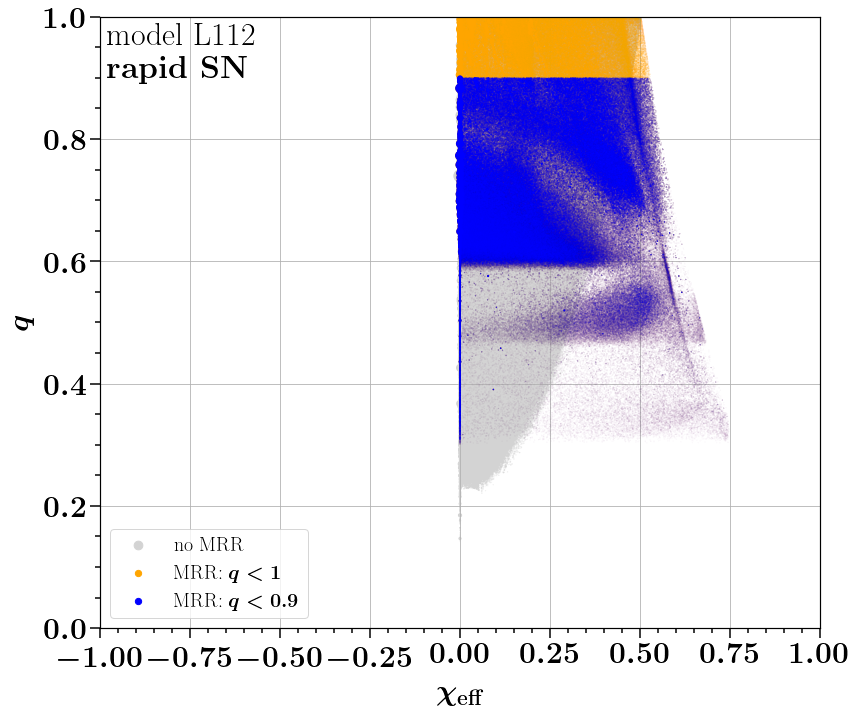

using indices
this should be 3x the same: 8879317 8879317 8879317
0  still had negative spin; we set these to 0 
	 non-zero spin: 5745582 out of  8879317 BBHs
	 a spin >.2:  3875191 out of  8879317 BBHs
[0.47662055 0.12455945 0.60909391 ... 0.16670142 0.10110757 0.15582898]


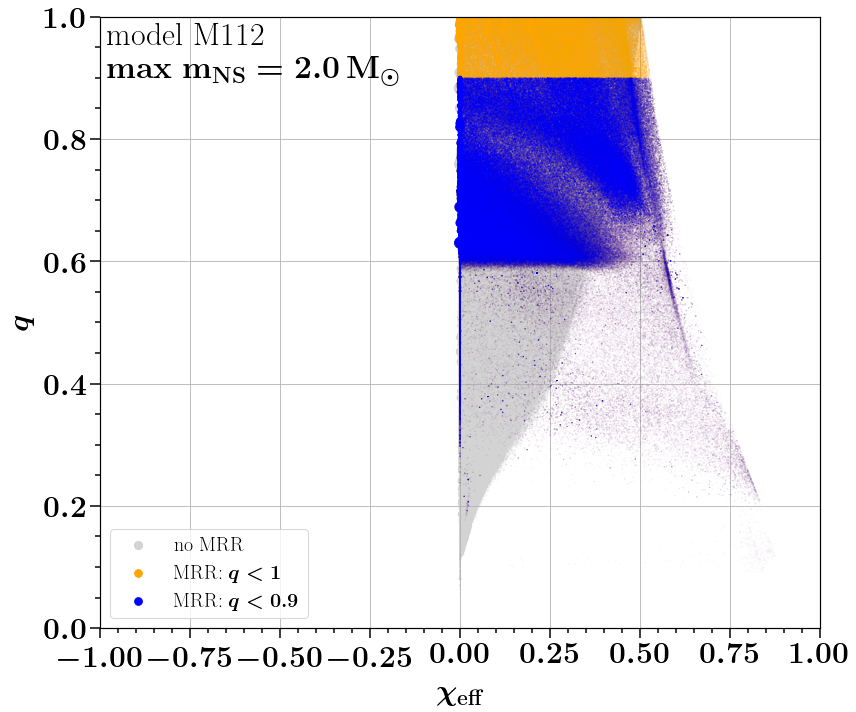

using indices
this should be 3x the same: 7906131 7906131 7906131
0  still had negative spin; we set these to 0 
	 non-zero spin: 4772083 out of  7906131 BBHs
	 a spin >.2:  3906070 out of  7906131 BBHs
[0.32253369 0.2247504  0.14384706 ... 0.10632654 0.12276775 0.12282541]


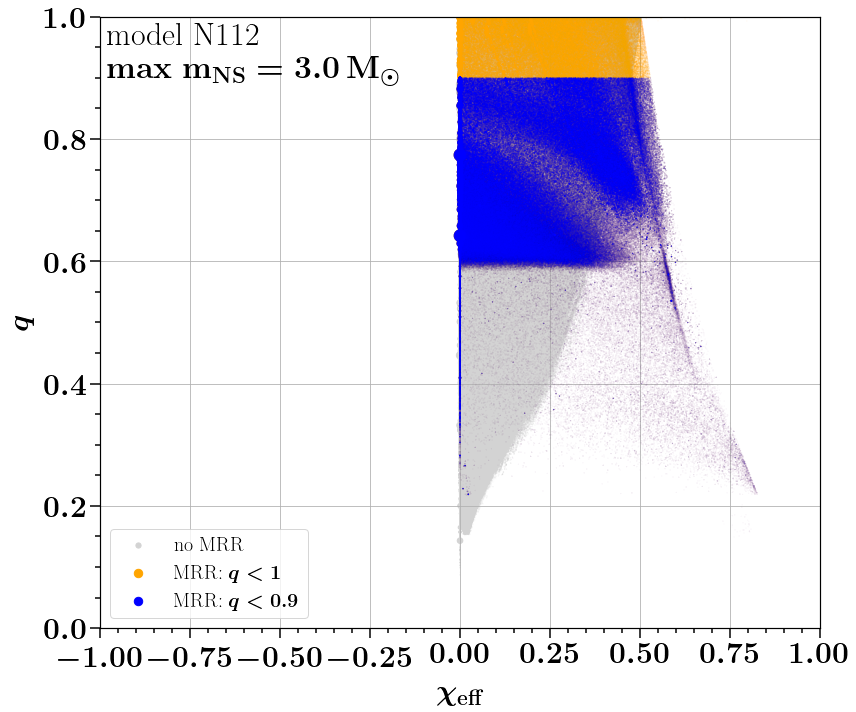

using indices
this should be 3x the same: 8547080 8547080 8547080
0  still had negative spin; we set these to 0 
	 non-zero spin: 5167225 out of  8547080 BBHs
	 a spin >.2:  3855844 out of  8547080 BBHs
[0.32051193 0.2247504  0.14384706 ... 0.10631442 0.12276775 0.118181  ]


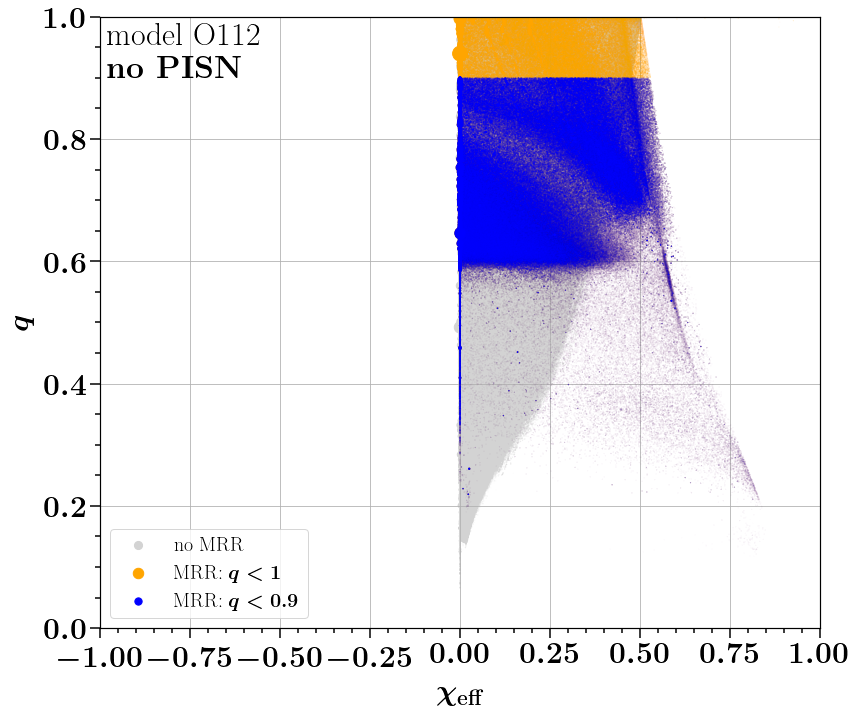

using indices
this should be 3x the same: 8106172 8106172 8106172
0  still had negative spin; we set these to 0 
	 non-zero spin: 5398926 out of  8106172 BBHs
	 a spin >.2:  3852194 out of  8106172 BBHs
[0.32253369 0.2247504  0.14384706 ... 0.10677297 0.11071291 0.10255505]


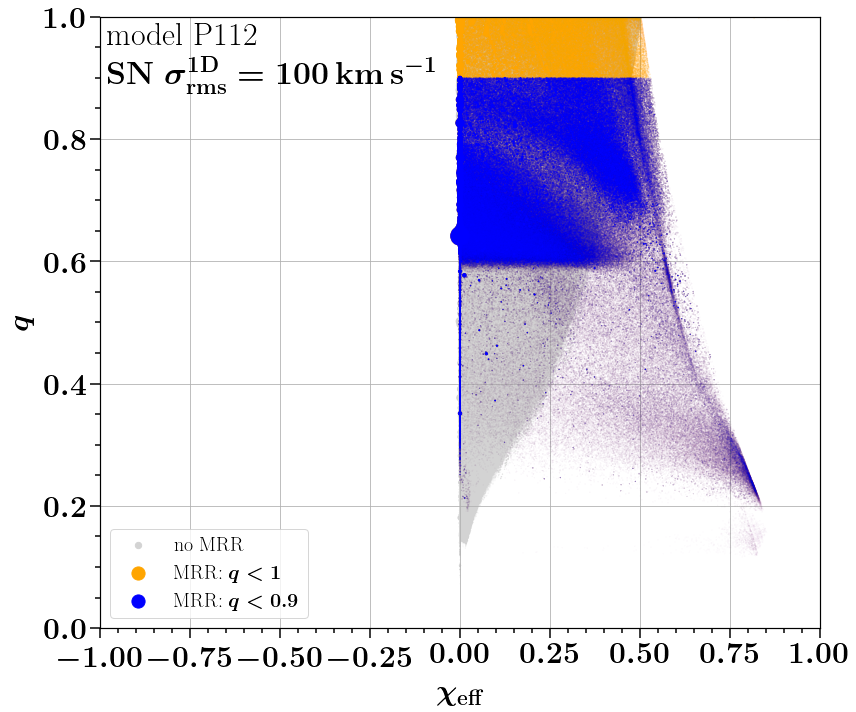

using indices
this should be 3x the same: 7609741 7609741 7609741
0  still had negative spin; we set these to 0 
	 non-zero spin: 5248368 out of  7609741 BBHs
	 a spin >.2:  3703667 out of  7609741 BBHs
[0.32253369 0.2247504  0.14384706 ... 0.10672943 0.10276456 0.10197349]


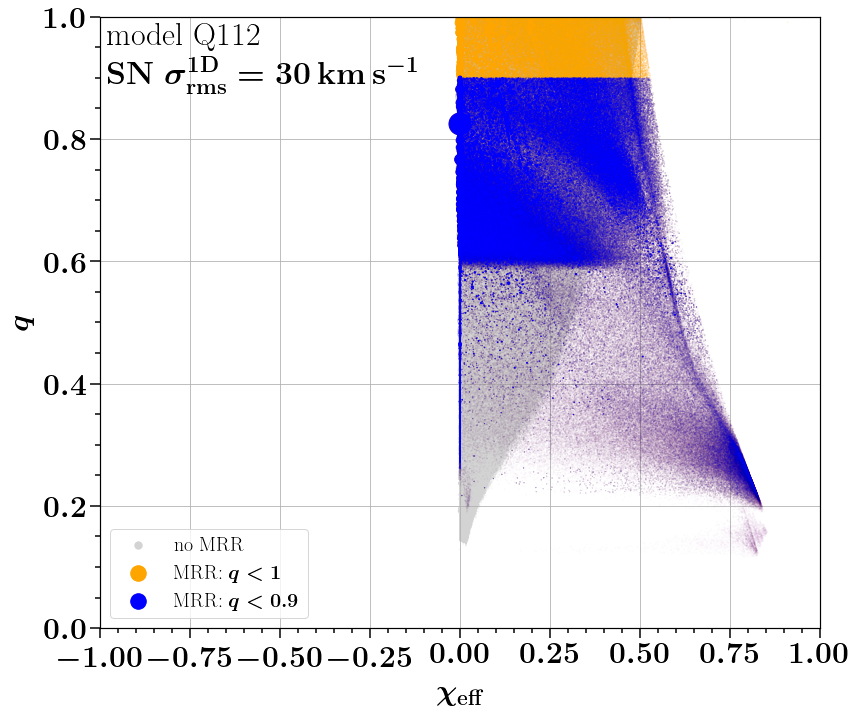

using indices
this should be 3x the same: 8777168 8777168 8777168
0  still had negative spin; we set these to 0 
	 non-zero spin: 6036606 out of  8777168 BBHs
	 a spin >.2:  4330286 out of  8777168 BBHs
[0.32253369 0.2247504  0.14384706 ... 0.10750364 0.1015331  0.10057114]


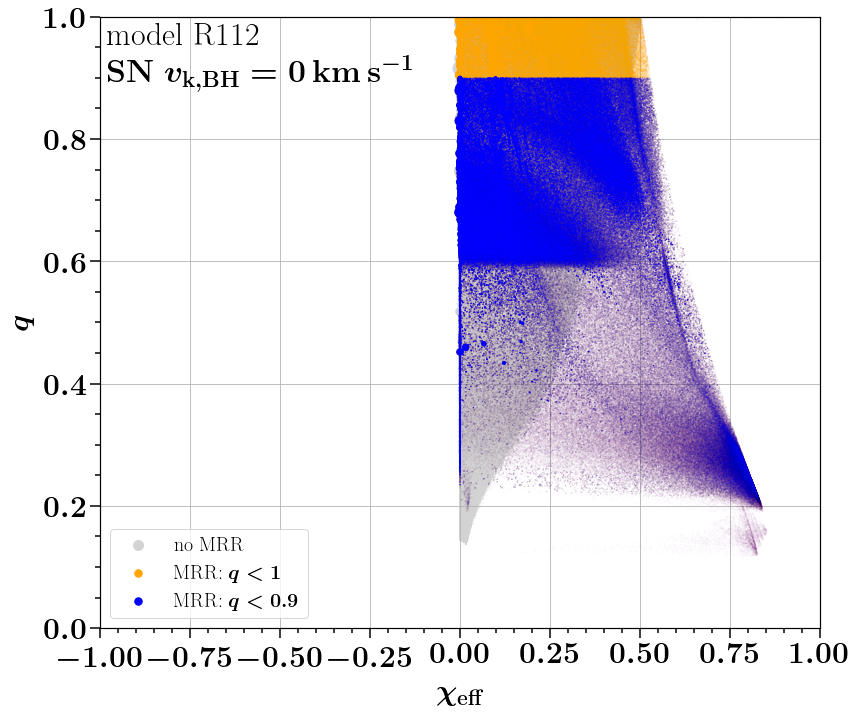

using indices
this should be 3x the same: 8921965 8921965 8921965
0  still had negative spin; we set these to 0 
	 non-zero spin: 5501227 out of  8921965 BBHs
	 a spin >.2:  4129039 out of  8921965 BBHs
[0.31887845 0.30373431 0.22576845 ... 0.19450372 0.17352079 0.26420368]


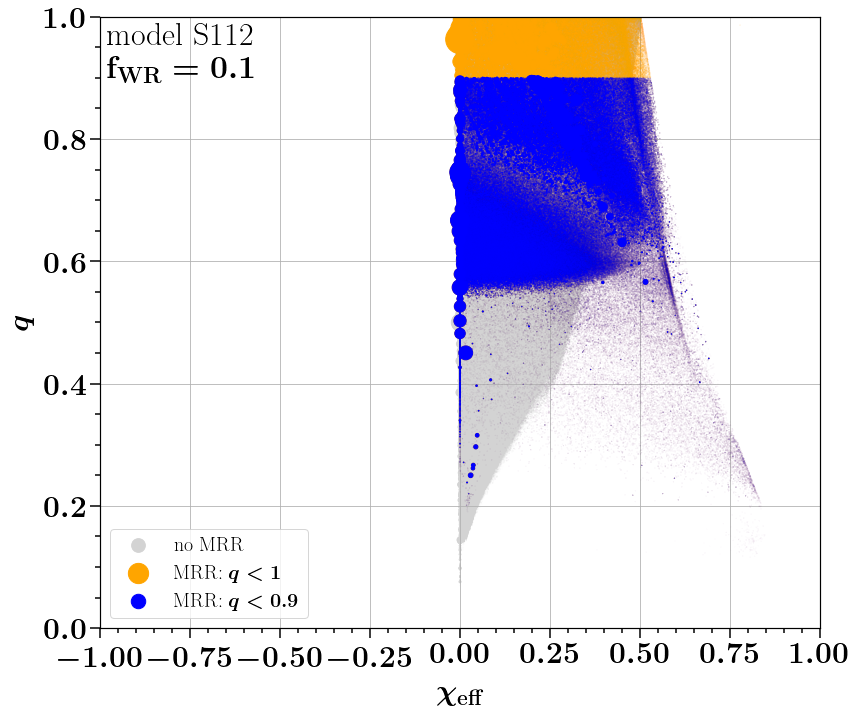

using indices
this should be 3x the same: 6748472 6748472 6748472
0  still had negative spin; we set these to 0 
	 non-zero spin: 4471136 out of  6748472 BBHs
	 a spin >.2:  3300922 out of  6748472 BBHs
[0.33196111 0.22030792 0.2261397  ... 0.13559805 0.12172912 0.11868595]


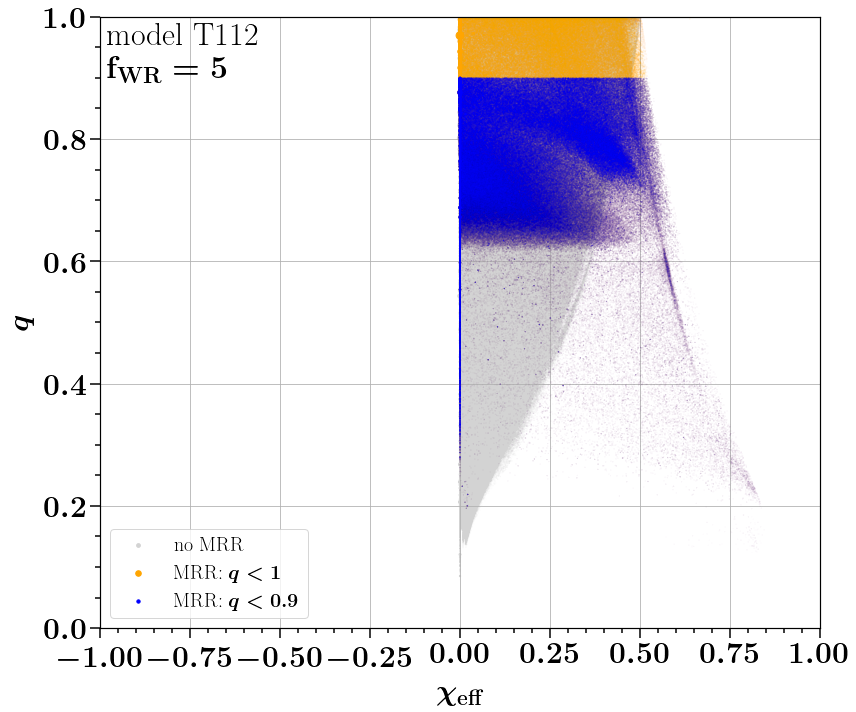

In [3]:
for model in ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:
# for model in ['P', 'Q', 'R', 'S', 'T']:

    mssfr = '112' # mssfr that matches LIGO observed rates.



    plot_Fig_GWTC(xparam='ChiEff_vs_q', BPSmodelName=model, mssfr=mssfr)

# Chirp mass vs q 

In [4]:
def plot_3Msun_lines(axes, xlim=[1,100]):
    
    # m1 = 3 Msun 
    q = np.linspace(0, 1, 100)
    m1 = 3
    mtot = (q+1) * m1
    
    axes.plot(mtot, q, c='gray', lw=2, linestyle=':', zorder=1E4)
    axes.text(mtot[10], q[10], s=r'$m_1 = 3 \, \rm{M}_{\odot}$', fontsize=fs-6, rotation=72, va='bottom', ha='center')
        
    # m2 = 3 Msun 
    q=np.linspace(0.001, 1, 100)
    m2 = 3 # Msun 
    mtot = (1+(1/q))*m2
    axes.plot(mtot, q, c='gray', lw=2, linestyle=':', zorder=1E4)
    axes.text(mtot[2], q[2], s=r'$m_2 = 3 \, \rm{M}_{\odot}$', fontsize=fs-6, rotation=-3)
    
    

    return

def make_up_axes(axes=None, xlim=[2,400], ylim=[0,1], xlabel=r'Total mass $[M_{\odot}]$', ylabel=r'q', logX=True,  logY=False):
    
    
    if (xlabel!=None) & (ylabel!=None):
        layoutAxes(ax=axes, nameX=xlabel, nameY=ylabel, labelpad=20)
    elif xlabel==None:
        layoutAxesNoXlabel(ax=axes, nameX=xlabel, nameY=ylabel, labelpad=20)
    elif ylabel==None:
        layoutAxesNoYlabel(ax=axes, nameX=xlabel, nameY=ylabel, labelpad=20)    
        
    axes.set_xlim(xlim[0],xlim[1])
    axes.set_ylim(ylim[0], ylim[1])
    
    if logX!=False:
        axes.set_xscale('log')     
    if logY!=False:
        axes.set_yscale('log')       
    return 




def plot_x_ticks(axe=None, xtick_loc=[1, 2, 4, 7, 10, 20, 40, 70, 100, 200, 400], ytick_loc=[0.2, 0.4, 0.6, 0.8], xlim=[2,400], ylim=[0,1]):
    

    
    xtick_name = []
    for ind, xtick in enumerate(xtick_loc):
        xtick_name.append(str(xtick))
        axe.plot(np.ones(100)*xtick, np.linspace(ylim[0], ylim[1], 100), c='lightgray', lw=1.2, linestyle='-', zorder=0)
    
    axe.set_xticks(xtick_loc)
    axe.set_xticklabels(xtick_name, fontsize=fs, rotation=0)#, orientation=30) 
    
    
    ytick_name = []
    for ind, ytick in enumerate(ytick_loc):
        ytick_name.append(str(ytick))
        axe.plot(np.linspace(xlim[0], xlim[1], 100), np.ones(100)*ytick, c='lightgray', lw=1.2, linestyle='-', zorder=0)
    
    axe.set_yticks(ytick_loc)
    axe.set_yticklabels(ytick_name, fontsize=fs, rotation=0)#, orientation=30)  
    
    axe.set_xlim(xlim[0], xlim[1])
    axe.set_ylim(ylim[0], ylim[1])
    
    
    # grid lines:
    
    
    
    return 







def plot_Fig_GWTC(xparam='chiEff', BPSmodelName='A', mssfr='112'):
    
    labellist= np.ones(5) #,  r'$\log_{10}(t) $']      
    fig, axe = plt.subplots(1,1, figsize=(20,10),\
                           gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1]})

    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    massCO_ZAMSM1 = fdata['doubleCompactObjects']['M1'][...].squeeze()
    massCO_ZAMSM2 = fdata['doubleCompactObjects']['M2'][...].squeeze()
    # M1 will be the most massive, M2 the least massive compact object. 
    massCO_LVKM1, massCO_LVKM2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
#     Chirpmass = chirpmass(M1, M2)
    MassRatioCO_LVK = massCO_LVKM2/massCO_LVKM1

    ### FOR SPIN ###
#     seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
#     seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
#     # get only SN seeds for DCOs 
#     maskSNdco = np.in1d(seedsSN,  seedsDCO) 
#     whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
#     whichSN1 = whichSN[::2] # get whichStar for first SN 
    

#     separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
#     separationPreSN2 = separationPreSN[1::2] # in Rsun. 
#     MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[maskSNdco][1::2]  
    
#     # the second SN is the most massive BH 
#     maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
#     mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
#     mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
#     print('nr of weird reversals = %s'%np.sum(mask_temp))
#     print('nr of normal reversals = %s'%np.sum(mask_2))
    
#     spinBH = QinBHspinmodel(separationPreSN2, M1, M2, np.ones_like(M1))    
     
        
    spin = COspin(data_path=path, state='he_depletion' )  # set class 
    spin.setCOMPASData() # reads in the COMPAS DCO parameters 
    spinZAMSM1, spinZAMSM2  = spin.BaveraSpin() #ZAMS M1 SPIN 
    
    
    maxSpinBBH = np.maximum(spinZAMSM1,spinZAMSM2)
    mask_ = (maxSpinBBH >0)
    print('\t non-zero spin:', np.sum(mask_), 'out of ', len(mask_), 'BBHs')
    mask_ = (maxSpinBBH >0.2)
    print('\t a spin >.2: ', np.sum(mask_), 'out of ', len(mask_), 'BBHs')
    
    mask_MRR = (massCO_ZAMSM1/massCO_ZAMSM2) < 1
    mask_muchMRR = (massCO_ZAMSM1/massCO_ZAMSM2) < 0.9  


    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    weights_ = fdata[fparam_key][weightheader][...].squeeze()
    w = weights_
    
    

    fs_l = 20 # label fontsize
    


    if xparam=='ChiEff_vs_q':
        axe.set_xlim(-1, 1)
        axe.set_ylim(0, 1)  
        chi_eff = ((spinZAMSM1 *massCO_ZAMSM1) + spinZAMSM2*massCO_ZAMSM2) / (massCO_ZAMSM1+massCO_ZAMSM2)
        param_x = chi_eff
        param_y = MassRatioCO_LVK
        nameX = r'$\chi_{\rm{eff}}$'
        nameY = r'$q$'
        
        
    elif xparam=='Mtot_vs_q':
        axe.set_xlim(2, 400)
        axe.set_ylim(0, 1)  

        param_x = massCO_ZAMSM1 + massCO_ZAMSM2
        param_y = MassRatioCO_LVK
        nameX = r'$M_{\rm{tot}} [M_{\odot}]$'
        nameY = r'$q$'
        
        plot_3Msun_lines(axes=axe, xlim=[2,400])

        
    NN_ = 1000
#     mask_nonZero = (chi_eff>0.1)
#     print(chi_eff[mask_nonZero])
    size_ = 1000
#     axe.scatter(param_x[~mask_MRR][:NN_], param_y[~mask_MRR][:NN_], s=size_*w[~mask_MRR][:NN_], color='lightgray', zorder=1, label=r'no MRR') # all non MRR 
#     axe.scatter(param_x[mask_MRR][:NN_], param_y[mask_MRR][:NN_], s=size_*w[mask_MRR][:NN_], color='orange', zorder=2, label=r'MRR: $q < 1$') # all non MRR 
#     axe.scatter(param_x[mask_muchMRR][:NN_], param_y[mask_muchMRR][:NN_], s=size_*w[mask_muchMRR][:NN_], color='blue', zorder=3, label=r'MRR: $q < 0.9$') # all non MRR 
    axe.scatter(param_x[~mask_MRR][:], param_y[~mask_MRR][:], s=size_*w[~mask_MRR][:], color='lightgray', zorder=1, label=r'no MRR') # all non MRR 
    axe.scatter(param_x[mask_MRR][:], param_y[mask_MRR][:], s=size_*w[mask_MRR][:], color='orange', zorder=2, label=r'MRR: $q < 1$') # all non MRR 
    axe.scatter(param_x[mask_muchMRR][:], param_y[mask_muchMRR][:], s=size_*w[mask_muchMRR][:], color='blue', zorder=3, label=r'MRR: $q < 0.9$') # all non MRR 
    
#     axe.scatter(param_x[:NN_], param_y[:NN_], s=440*w[:NN_], color='lightgray', zorder=1)
#     axe.scatter(param_x, param_y, s=800*w, color='gray', zorder=1)
    
    axe = layoutAxes(axe, nameX=nameX, nameY=nameY, setMinor=True, labelpad=10, fontsize=fs_l+10)


    
    
    axe.text(0+0.009, 1-0.009, 'model %s%s \n %s'%(BPSmodelName,mssfr,alphabetPhysicalNameDict[BPSmodelName]) , rotation = 0, fontsize = fs+8, color = 'k', ha = 'left', va='top', transform=axe.transAxes, zorder=100)#, weight = 'bold')
    
    plt.legend(fontsize=fs_l, loc=3)
    
    if xparam=='Mtot_vs_q':

        make_up_axes(axes=axe) 
        plot_x_ticks(axe=axe) # has to go after make_up_axes 

    else:
        plt.grid(True)
    
    
    
    
    
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)#2)
    
    fig.tight_layout() 
    plt.savefig('./' + xparam + '_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
    plt.show()    
    
    return 









using indices
this should be 3x the same: 8371398 8371398 8371398
0  still had negative spin; we set these to 0 
	 non-zero spin: 5228856 out of  8371398 BBHs
	 a spin >.2:  3905367 out of  8371398 BBHs


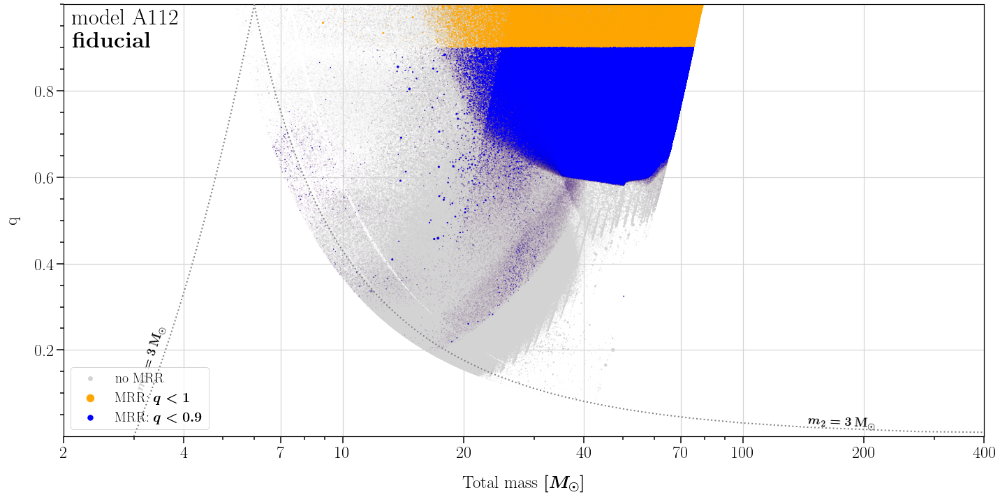

using indices
this should be 3x the same: 8616008 8616008 8616008
0  still had negative spin; we set these to 0 
	 non-zero spin: 7429825 out of  8616008 BBHs
	 a spin >.2:  6109485 out of  8616008 BBHs


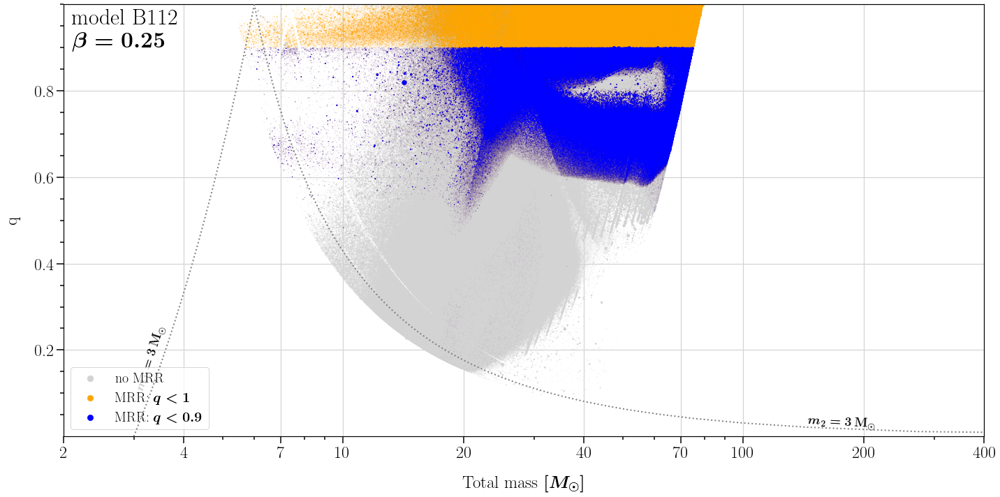

using indices
this should be 3x the same: 6568454 6568454 6568454
3  still had negative spin; we set these to 0 
	 non-zero spin: 4897679 out of  6568454 BBHs
	 a spin >.2:  4120254 out of  6568454 BBHs


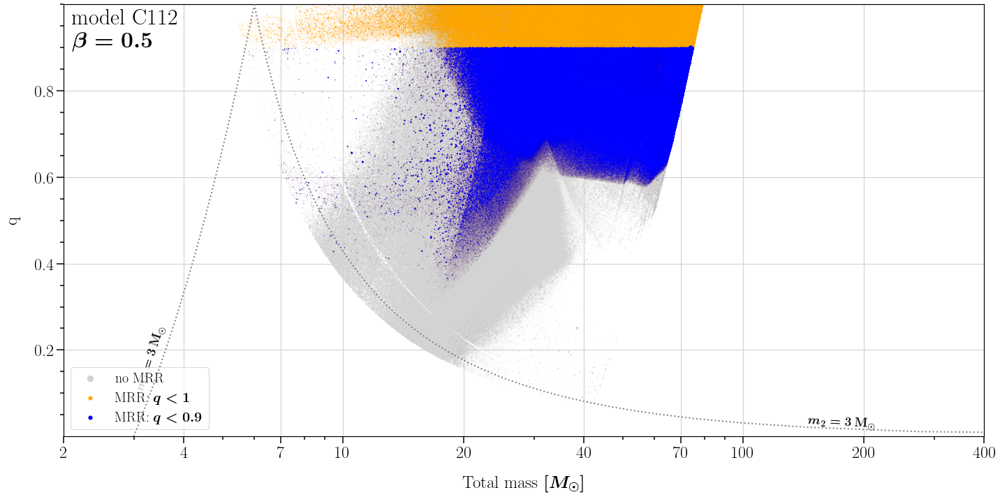

using indices
this should be 3x the same: 6033721 6033721 6033721
0  still had negative spin; we set these to 0 
	 non-zero spin: 3106682 out of  6033721 BBHs
	 a spin >.2:  2358652 out of  6033721 BBHs


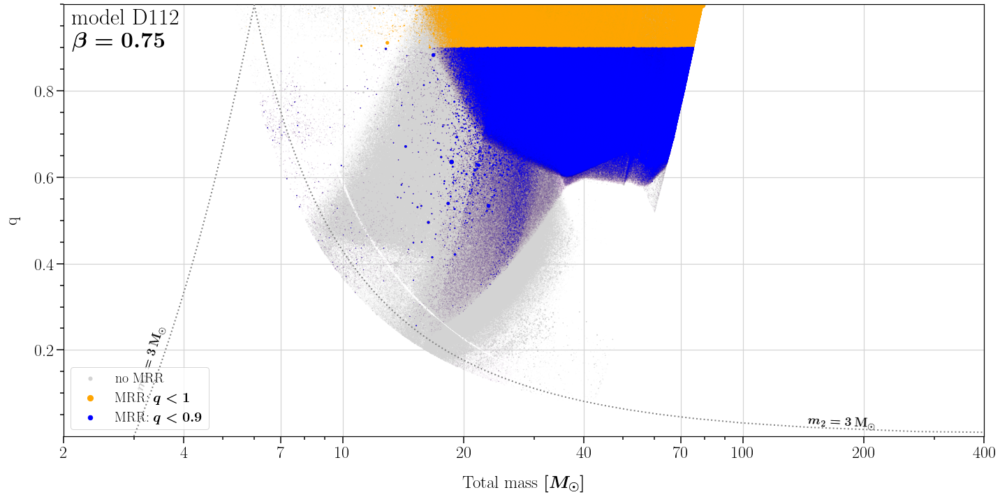

using indices
this should be 3x the same: 9274636 9274636 9274636
0  still had negative spin; we set these to 0 
	 non-zero spin: 5768476 out of  9274636 BBHs
	 a spin >.2:  4313648 out of  9274636 BBHs


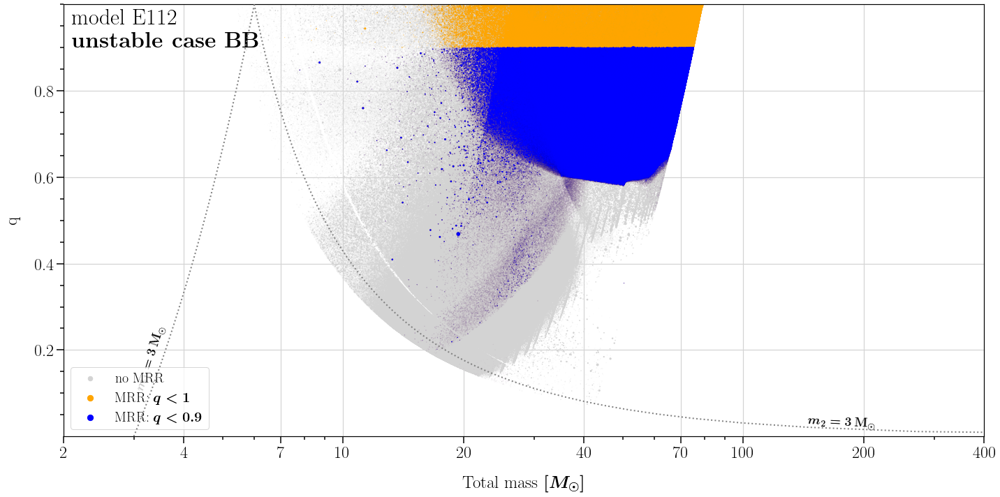

using indices
this should be 3x the same: 9782847 9782847 9782847
140  still had negative spin; we set these to 0 
	 non-zero spin: 6164708 out of  9782847 BBHs
	 a spin >.2:  4670311 out of  9782847 BBHs


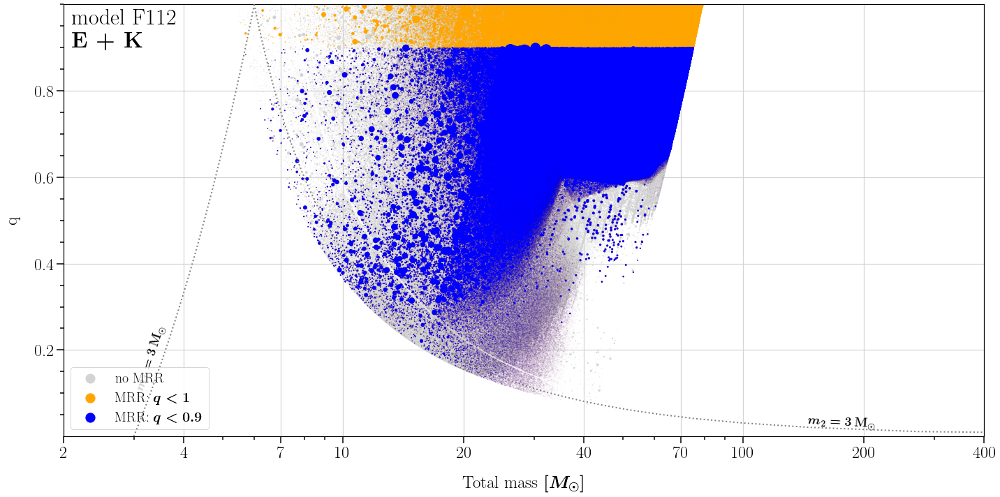

using indices
this should be 3x the same: 6338030 6338030 6338030
0  still had negative spin; we set these to 0 
	 non-zero spin: 1780455 out of  6338030 BBHs
	 a spin >.2:  1384802 out of  6338030 BBHs


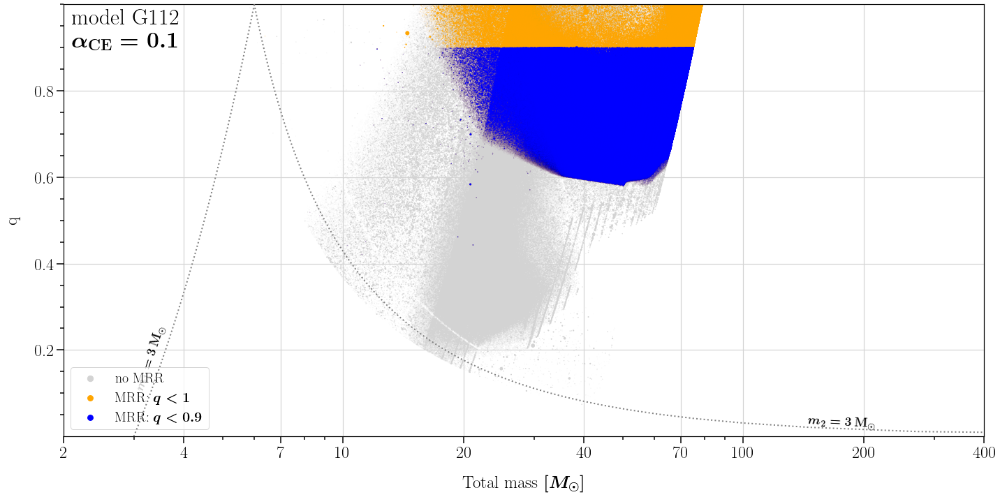

using indices
this should be 3x the same: 7958497 7958497 7958497
0  still had negative spin; we set these to 0 
	 non-zero spin: 3979199 out of  7958497 BBHs
	 a spin >.2:  3220770 out of  7958497 BBHs


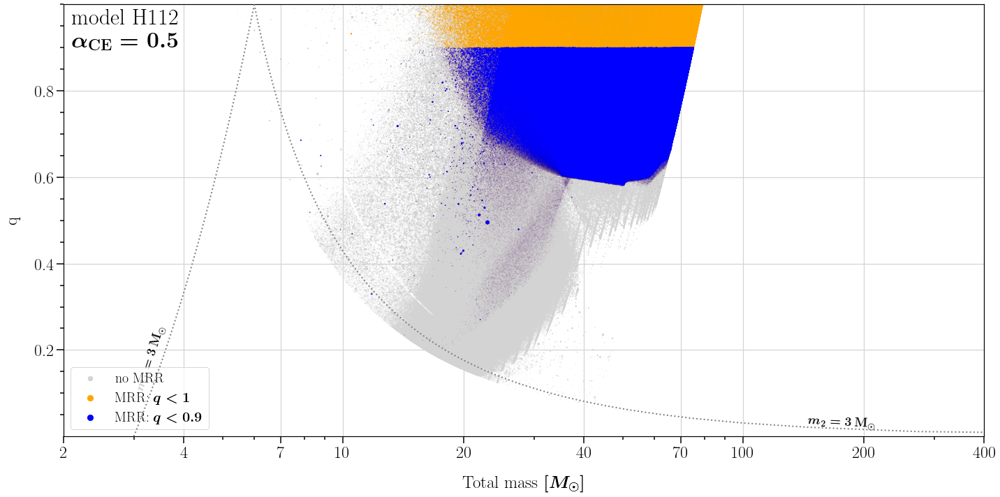

using indices
this should be 3x the same: 6212236 6212236 6212236
0  still had negative spin; we set these to 0 
	 non-zero spin: 3292965 out of  6212236 BBHs
	 a spin >.2:  1981579 out of  6212236 BBHs


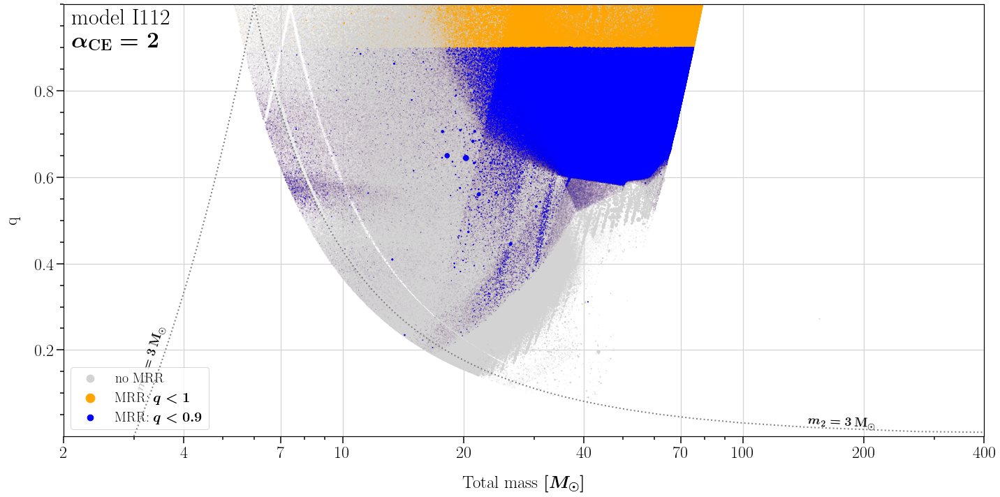

using indices
this should be 3x the same: 3514443 3514443 3514443
0  still had negative spin; we set these to 0 
	 non-zero spin: 604549 out of  3514443 BBHs
	 a spin >.2:  274924 out of  3514443 BBHs


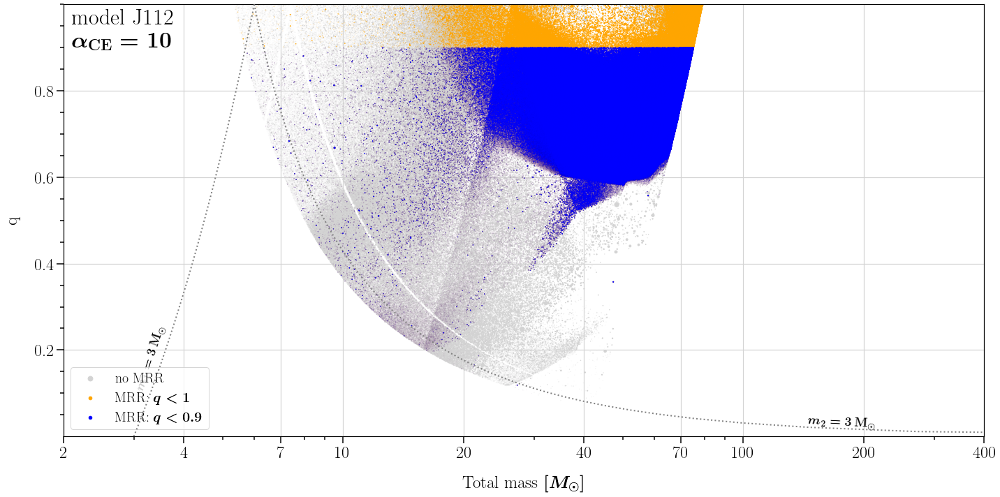

using indices
this should be 3x the same: 8782290 8782290 8782290
0  still had negative spin; we set these to 0 
	 non-zero spin: 5583001 out of  8782290 BBHs
	 a spin >.2:  4225522 out of  8782290 BBHs


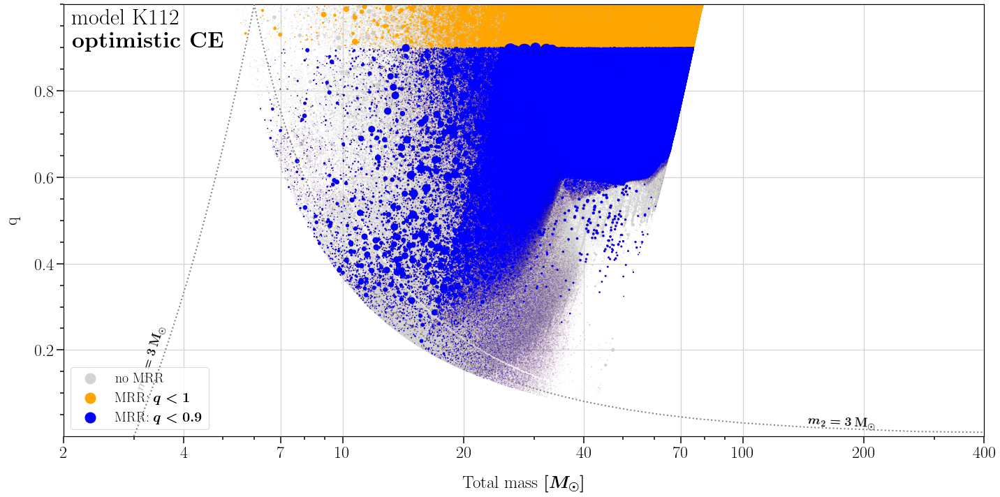

using indices
this should be 3x the same: 7463923 7463923 7463923
0  still had negative spin; we set these to 0 
	 non-zero spin: 4487675 out of  7463923 BBHs
	 a spin >.2:  3707782 out of  7463923 BBHs


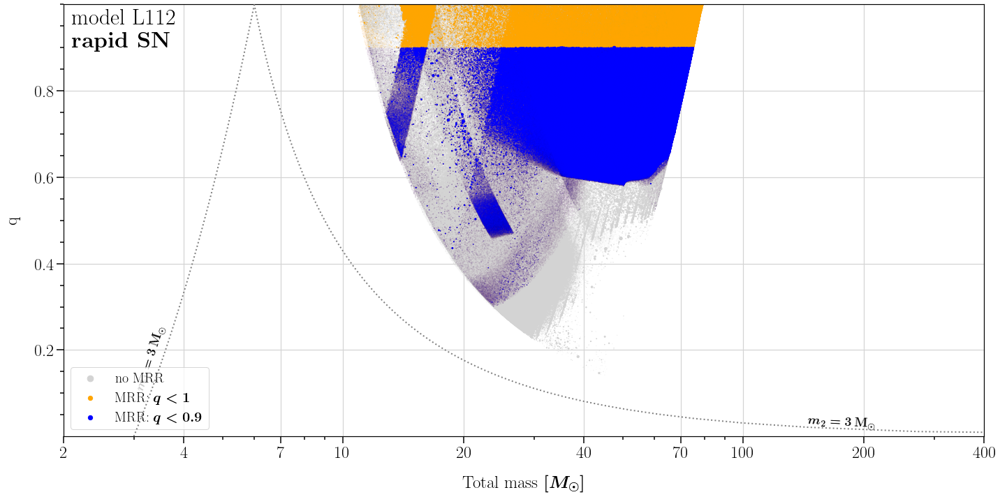

using indices
this should be 3x the same: 8879317 8879317 8879317
0  still had negative spin; we set these to 0 
	 non-zero spin: 5745582 out of  8879317 BBHs
	 a spin >.2:  3875191 out of  8879317 BBHs


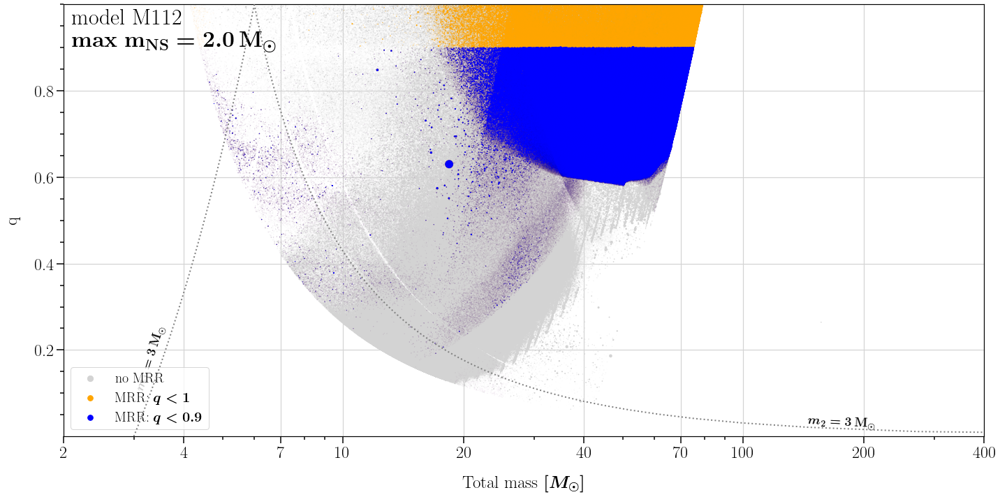

using indices
this should be 3x the same: 7906131 7906131 7906131
0  still had negative spin; we set these to 0 
	 non-zero spin: 4772083 out of  7906131 BBHs
	 a spin >.2:  3906070 out of  7906131 BBHs


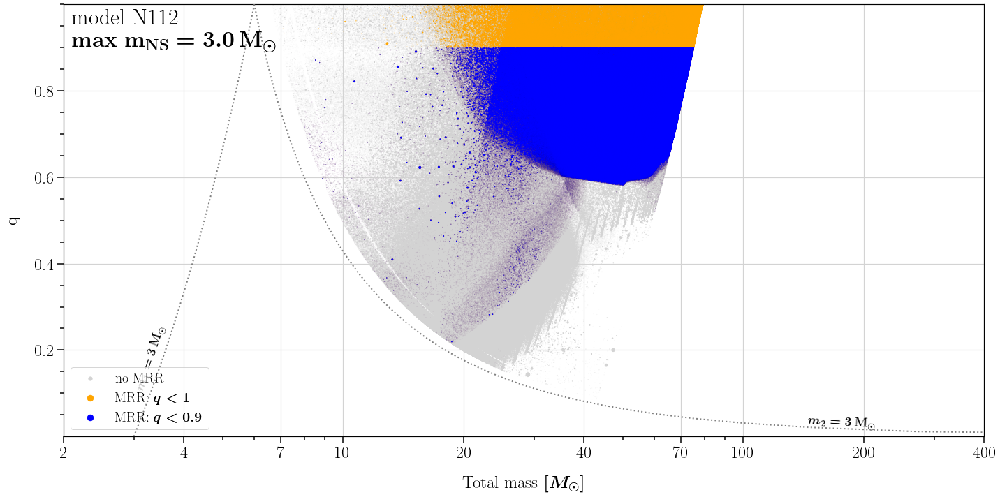

using indices
this should be 3x the same: 8547080 8547080 8547080
0  still had negative spin; we set these to 0 
	 non-zero spin: 5167225 out of  8547080 BBHs
	 a spin >.2:  3855844 out of  8547080 BBHs


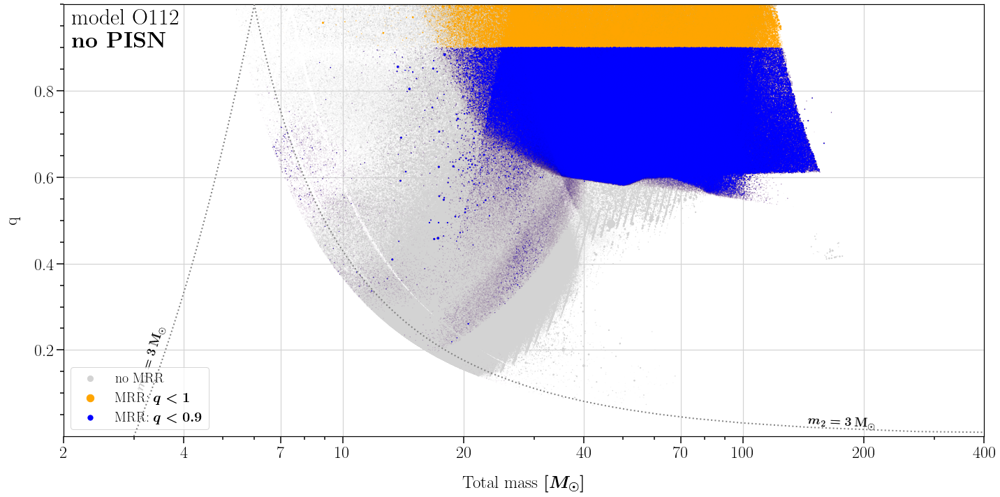

using indices
this should be 3x the same: 8106172 8106172 8106172
0  still had negative spin; we set these to 0 
	 non-zero spin: 5398926 out of  8106172 BBHs
	 a spin >.2:  3852194 out of  8106172 BBHs


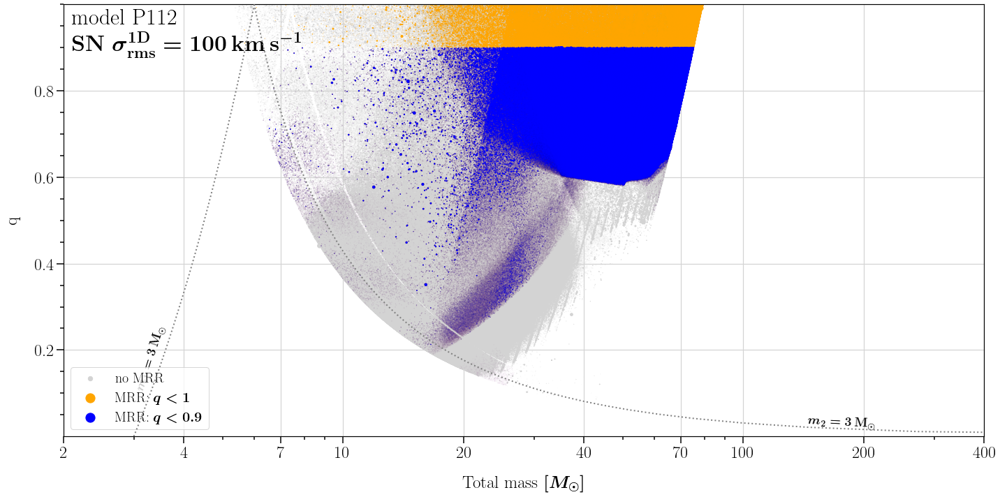

using indices
this should be 3x the same: 7609741 7609741 7609741
0  still had negative spin; we set these to 0 
	 non-zero spin: 5248368 out of  7609741 BBHs
	 a spin >.2:  3703667 out of  7609741 BBHs


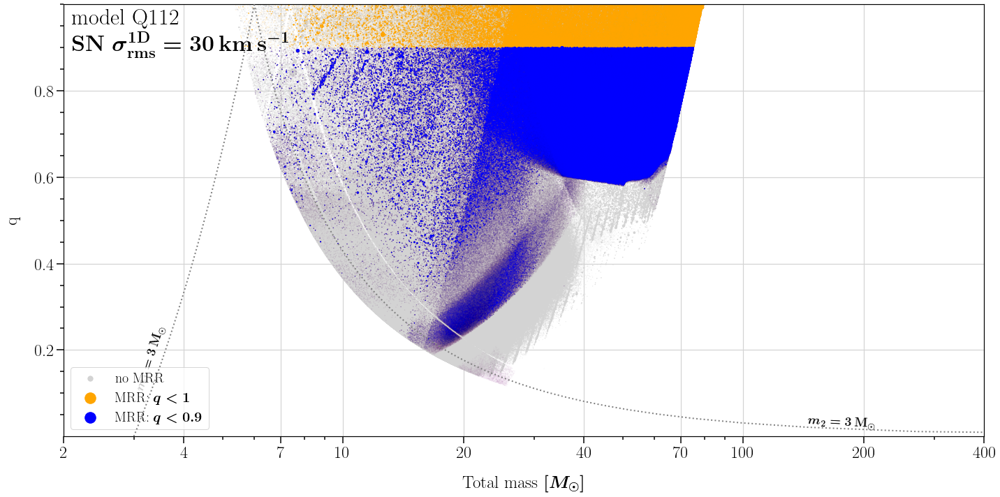

using indices
this should be 3x the same: 8777168 8777168 8777168
0  still had negative spin; we set these to 0 
	 non-zero spin: 6036606 out of  8777168 BBHs
	 a spin >.2:  4330286 out of  8777168 BBHs


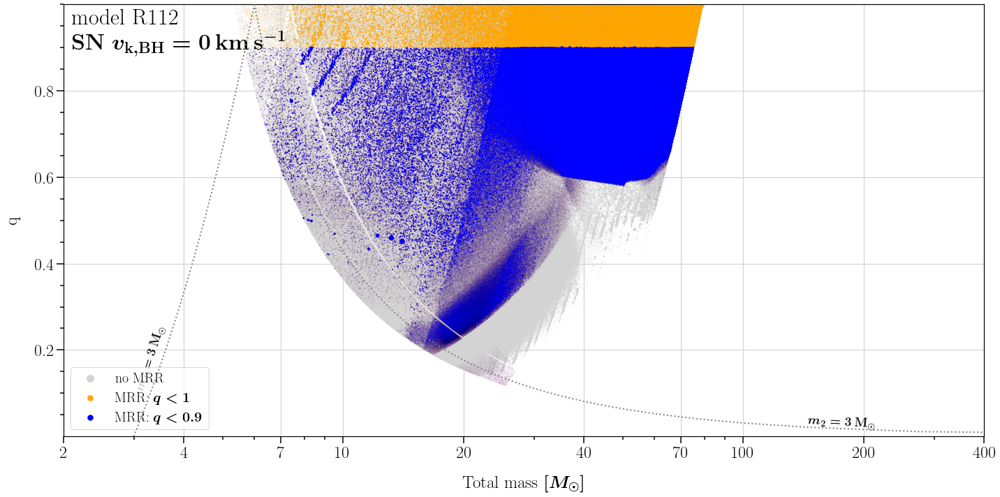

using indices
this should be 3x the same: 8921965 8921965 8921965
0  still had negative spin; we set these to 0 
	 non-zero spin: 5501227 out of  8921965 BBHs
	 a spin >.2:  4129039 out of  8921965 BBHs


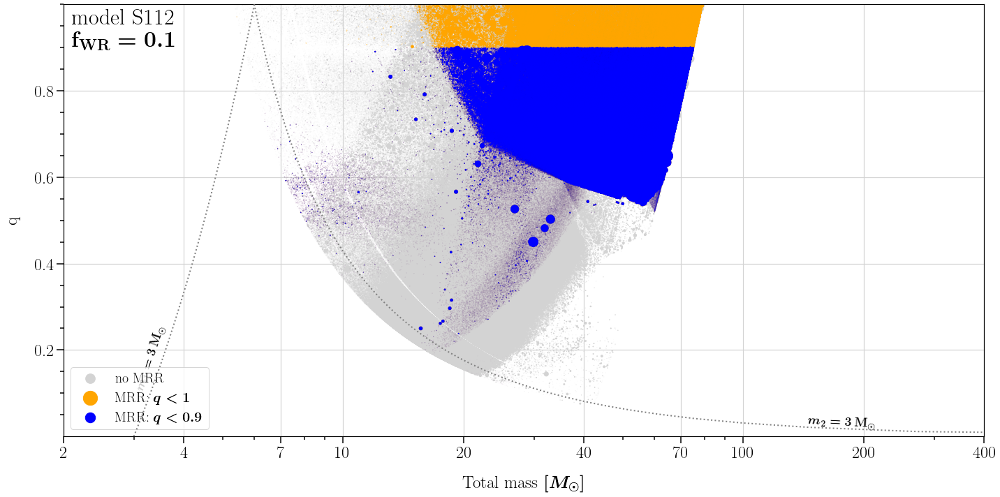

using indices
this should be 3x the same: 6748472 6748472 6748472
0  still had negative spin; we set these to 0 
	 non-zero spin: 4471136 out of  6748472 BBHs
	 a spin >.2:  3300922 out of  6748472 BBHs


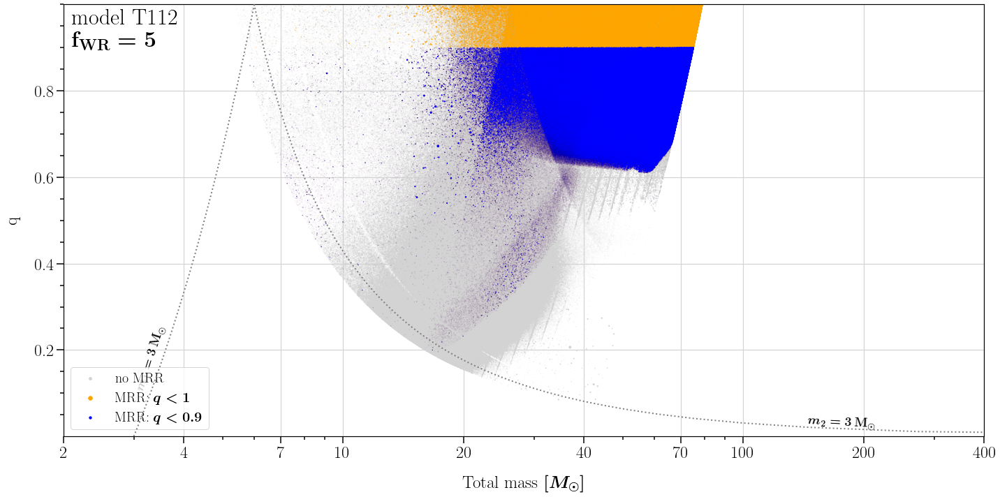

In [5]:
# for model in ['B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:
for model in ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:

    mssfr = '112' # mssfr that matches LIGO observed rates.



    plot_Fig_GWTC(xparam='Mtot_vs_q', BPSmodelName=model, mssfr=mssfr)

In [ ]:
# for model in ['B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:
for model in ['B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:

    mssfr = '112' # mssfr that matches LIGO observed rates.



    plot_Fig_GWTC(xparam='Mtot_vs_q', BPSmodelName=model, mssfr=mssfr)

# M1 vs M2 vs spin (colored)

In [ ]:

fs=20
import math 



def plotqlines(ax, qlist, qtextvalue):
    """qlist = [5., 3.333333334, 2., 1.]"""
    ## Add constant mass ratio lines 
    x_q = np.linspace(1,50) # Msun, M1 range
    # plot a few fixed mass ratios:
#     xmin = 1 
    xmin, xmax = 1, 50 
    ymin, ymax = 1, 50
    for ind_q, qvalue in enumerate(qlist):
        y_q =  x_q / qvalue


        y_text = 28 # Msun 
        if y_text*qvalue < 50:
            x_text = y_text * qvalue 
        else: 
            x_text = 40.
            y_text = x_text / qvalue

        # I am calculating the angle theta for the text: (see notes on this)
        delta_y = ((y_text - ymin) / (ymax-ymin)) 
        delta_x = ((x_text - xmin*qvalue) / (xmax-xmin))
        ratio = delta_y / delta_x
        theta_angle = math.degrees(math.atan((ratio)))

        ax.plot(x_q, y_q, c='k', lw=2, linestyle =':', zorder=100000)
        ax.text(x_text, y_text, s=r'$q_{\rm{f}} =$ %s '%qtextvalue[ind_q], fontsize=24, \
                       horizontalalignment='center', verticalalignment='bottom', rotation=theta_angle, zorder=100000)   

        
        




def plot2DdistributionScatter_ZOOM(BPSmodelName='A', mssfr='112'):
    
    labellist= np.ones(5) #,  r'$\log_{10}(t) $']      
    fig, ax = plt.subplots(1,2, figsize=(16,16),\
                           gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1,0.04]})

    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    
    
    M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
    M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1

    ### FOR SPIN ###
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
    whichSN1 = whichSN[::2] # get whichStar for first SN 
    

    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 
    MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[maskSNdco][1::2]  
    
    # the second SN is the most massive BH 
    maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
    mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
    mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
    print('nr of weird reversals = %s'%np.sum(mask_temp))
    print('nr of normal reversals = %s'%np.sum(mask_2))
    
    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, np.ones_like(M1))    
    

        
        
        
    spin = COspin(data_path=path)  # set class 
    spin.setCOMPASData() # reads in the COMPAS DCO parameters 
    spinM1, spinM2  = spin.BaveraSpin()
    
    maxSpinBBH = np.maximum(spinM1,spinM2)
    mask_ = (maxSpinBBH >0)
    print('non-zero spin:', np.sum(mask_), 'out of ', len(mask_), 'BBHs')
    
    COLOR_ =  maxSpinBBH


    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    weights_ = fdata[fparam_key][weightheader][...].squeeze()
        
        
        
        
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$ ',\
           r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    
    
    M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
    M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
    separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
    Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
    massRatio = M2ZAMS / M1ZAMS 

    
    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS primary', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS secondary',\
           r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $']         
    
            
    varlist = [Chirpmass, M1BH, M2BH, MassRatio,   np.log10(separationPreSN2)]
    w = weights_
    

    fs_l = 20 # label fontsize
    

    LEGEND = True 
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]
    param_x = M1BH
    param_y = M2BH 
    
    
    ### PLOT PLOT ### 
    axe = ax[0]

    plotqlines(ax=axe, qlist=[0.2, 0.5, 1,2,5], qtextvalue=['5', '2', '1', '0.5', '0.2'])
#     axe.set_xlim(min(param_x), max(param_x))
#     axe.set_ylim(min(param_y), max(param_y))      
    axe.set_xlim(1, 50)
    axe.set_ylim(1, 50)  
    NN_ = 1000

#     axe.scatter(param_x[:NN_], param_y[:NN_], s=440*w[:NN_], color='lightgray', zorder=1)
    axe.scatter(param_x, param_y, s=800*w, color='gray', zorder=1)
    
    axe = layoutAxes(axe, nameX=labellist[1], nameY=labellist[2], setMinor=True, labelpad=10, fontsize=fs_l+10)



    cm = plt.cm.get_cmap('viridis_r')
#     sc = ax[0].scatter(param_x[mask_][0:100], param_y[mask_][0:100], s=440*w[mask_][0:100], c=COLOR_[mask_][0:100], zorder=10, vmin=0, vmax=1,cmap=cm)
    sc = ax[0].scatter(param_x[mask_], param_y[mask_], s=800*w[mask_], c=COLOR_[mask_], zorder=10, vmin=0, vmax=1,cmap=cm)
    cbar = fig.colorbar(sc, cax=ax[1], orientation='vertical' , format="%.2f")#, boundaries=np.logspace(np.log10(min(center)),max(np.log10(center)),5))#orientation="horizontal", pad=0.2)
    cbar.ax.tick_params(labelsize=20, labeltop=True, labelbottom=False, bottom=False, top=True)
    cbar.set_label(r'$\textbf{spin}$', fontsize=fs+15)
    
    
    ax[0].text(0+0.009, 1-0.009, 'model %s%s \n %s'%(BPSmodelName,mssfr,alphabetPhysicalNameDict[BPSmodelName]) , rotation = 0, fontsize = fs+8, color = 'k', ha = 'left', va='top', transform=ax[0].transAxes, zorder=100)#, weight = 'bold')
    

    
    
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)#2)
    
    fig.tight_layout() 
    plt.savefig('./Scatter_Final_BaveraSpin_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
    plt.show()    
    
    return 







for model in ['A','B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:


    mssfr = '112' # mssfr that matches LIGO observed rates.



    plot2DdistributionScatter_ZOOM(BPSmodelName=model, mssfr=mssfr)


In [ ]:

fs=20
import math 



def plotqlines(ax, qlist, qtextvalue):
    """qlist = [5., 3.333333334, 2., 1.]"""
    ## Add constant mass ratio lines 
    x_q = np.linspace(1,50) # Msun, M1 range
    # plot a few fixed mass ratios:
#     xmin = 1 
    xmin, xmax = 1, 50 
    ymin, ymax = 1, 50
    for ind_q, qvalue in enumerate(qlist):
        y_q =  x_q / qvalue


        y_text = 28 # Msun 
        if y_text*qvalue < 50:
            x_text = y_text * qvalue 
        else: 
            x_text = 40.
            y_text = x_text / qvalue

        # I am calculating the angle theta for the text: (see notes on this)
        delta_y = ((y_text - ymin) / (ymax-ymin)) 
        delta_x = ((x_text - xmin*qvalue) / (xmax-xmin))
        ratio = delta_y / delta_x
        theta_angle = math.degrees(math.atan((ratio)))

        ax.plot(x_q, y_q, c='k', lw=2, linestyle =':', zorder=100000)
        ax.text(x_text, y_text, s=r'$q_{\rm{f}} =$ %s '%qtextvalue[ind_q], fontsize=24, \
                       horizontalalignment='center', verticalalignment='bottom', rotation=theta_angle, zorder=100000)   

        
        




def plot2DdistributionScatter_ZOOM(BPSmodelName='A', mssfr='112'):
    
    labellist= np.ones(5) #,  r'$\log_{10}(t) $']      
    fig, ax = plt.subplots(1,2, figsize=(16,16),\
                           gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1,0.04]})

    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    
    
    M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
    M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1

    ### FOR SPIN ###
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
    whichSN1 = whichSN[::2] # get whichStar for first SN 
    

    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 
    MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[maskSNdco][1::2]  
    
    # the second SN is the most massive BH 
    maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
    mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
    mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
    print('nr of weird reversals = %s'%np.sum(mask_temp))
    print('nr of normal reversals = %s'%np.sum(mask_2))
    
    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, np.ones_like(M1))    
    

        
        
        
    spin = COspin(data_path=path)  # set class 
    spin.setCOMPASData() # reads in the COMPAS DCO parameters 
    spinM1, spinM2  = spin.BaveraSpin()
    
    maxSpinBBH = np.maximum(spinM1,spinM2)
    mask_ = (maxSpinBBH >0)
    print('non-zero spin:', np.sum(mask_), 'out of ', len(mask_), 'BBHs')
    
    
    
    # plot ZAMS 1 Spin 
    COLOR_ =  spinM1


    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    weights_ = fdata[fparam_key][weightheader][...].squeeze()
        
        
        
        
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$ ',\
           r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    
    
    M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
    M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
    separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
    Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
    massRatio = M2ZAMS / M1ZAMS 

    
    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS primary', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS secondary',\
           r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $']         
    
            
    varlist = [Chirpmass, M1BH, M2BH, MassRatio,   np.log10(separationPreSN2)]
    w = weights_
    

    fs_l = 20 # label fontsize
    

    LEGEND = True 
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]
    param_x = M1BH
    param_y = M2BH 
    
    
    ### PLOT PLOT ### 
    axe = ax[0]

    plotqlines(ax=axe, qlist=[0.2, 0.5, 1,2,5], qtextvalue=['5', '2', '1', '0.5', '0.2'])
#     axe.set_xlim(min(param_x), max(param_x))
#     axe.set_ylim(min(param_y), max(param_y))      
    axe.set_xlim(1, 50)
    axe.set_ylim(1, 50)  
    NN_ = 1000

#     axe.scatter(param_x[:NN_], param_y[:NN_], s=440*w[:NN_], color='lightgray', zorder=1)
    axe.scatter(param_x, param_y, s=800*w, color='gray', zorder=1)
    
    axe = layoutAxes(axe, nameX=labellist[1], nameY=labellist[2], setMinor=True, labelpad=10, fontsize=fs_l+10)



    cm = plt.cm.get_cmap('viridis_r')
#     sc = ax[0].scatter(param_x[mask_][0:100], param_y[mask_][0:100], s=440*w[mask_][0:100], c=COLOR_[mask_][0:100], zorder=10, vmin=0, vmax=1,cmap=cm)
    sc = ax[0].scatter(param_x[mask_], param_y[mask_], s=800*w[mask_], c=COLOR_[mask_], zorder=10, vmin=0, vmax=1,cmap=cm)
    cbar = fig.colorbar(sc, cax=ax[1], orientation='vertical' , format="%.2f")#, boundaries=np.logspace(np.log10(min(center)),max(np.log10(center)),5))#orientation="horizontal", pad=0.2)
    cbar.ax.tick_params(labelsize=20, labeltop=True, labelbottom=False, bottom=False, top=True)
    cbar.set_label(r'$\textbf{spin}$', fontsize=fs+15)
    
    
    ax[0].text(0+0.009, 1-0.009, 'model %s%s \n %s'%(BPSmodelName,mssfr,alphabetPhysicalNameDict[BPSmodelName]) , rotation = 0, fontsize = fs+8, color = 'k', ha = 'left', va='top', transform=ax[0].transAxes, zorder=100)#, weight = 'bold')
    

    
    
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)#2)
    
    fig.tight_layout() 
    plt.savefig('./Scatter_Final_BaveraSpin_spinZAMSm1' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
    plt.show()    
    
    return 







for model in ['A']: #,'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:


    mssfr = '112' # mssfr that matches LIGO observed rates.



    plot2DdistributionScatter_ZOOM(BPSmodelName=model, mssfr=mssfr)


In [ ]:

fs=20
import math 



def plotqlines(ax, qlist, qtextvalue):
    """qlist = [5., 3.333333334, 2., 1.]"""
    ## Add constant mass ratio lines 
    x_q = np.linspace(1,50) # Msun, M1 range
    # plot a few fixed mass ratios:
#     xmin = 1 
    xmin, xmax = 1, 50 
    ymin, ymax = 1, 50
    for ind_q, qvalue in enumerate(qlist):
        y_q =  x_q / qvalue


        y_text = 28 # Msun 
        if y_text*qvalue < 50:
            x_text = y_text * qvalue 
        else: 
            x_text = 40.
            y_text = x_text / qvalue

        # I am calculating the angle theta for the text: (see notes on this)
        delta_y = ((y_text - ymin) / (ymax-ymin)) 
        delta_x = ((x_text - xmin*qvalue) / (xmax-xmin))
        ratio = delta_y / delta_x
        theta_angle = math.degrees(math.atan((ratio)))

        ax.plot(x_q, y_q, c='k', lw=2, linestyle =':', zorder=100000)
        ax.text(x_text, y_text, s=r'$q_{\rm{f}} =$ %s '%qtextvalue[ind_q], fontsize=24, \
                       horizontalalignment='center', verticalalignment='bottom', rotation=theta_angle, zorder=100000)   

        
        




def plot2DdistributionScatter_ZOOM(BPSmodelName='A', mssfr='112'):
    
    labellist= np.ones(5) #,  r'$\log_{10}(t) $']      
    fig, ax = plt.subplots(1,2, figsize=(16,16),\
                           gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1,0.04]})

    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    
    
    M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
    M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1

    ### FOR SPIN ###
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
    whichSN1 = whichSN[::2] # get whichStar for first SN 
    

    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 
    MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[maskSNdco][1::2]  
    
    # the second SN is the most massive BH 
    maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
    mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
    mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
    print('nr of weird reversals = %s'%np.sum(mask_temp))
    print('nr of normal reversals = %s'%np.sum(mask_2))
    
    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, np.ones_like(M1))    
    

        
        
        
    spin = COspin(data_path=path)  # set class 
    spin.setCOMPASData() # reads in the COMPAS DCO parameters 
    spinM1, spinM2  = spin.BaveraSpin()
    
    maxSpinBBH = np.maximum(spinM1,spinM2)
    mask_ = (maxSpinBBH >0)
    print('non-zero spin:', np.sum(mask_), 'out of ', len(mask_), 'BBHs')
    
    
    
    # plot ZAMS 1 Spin 
    COLOR_ =  spinM2


    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    weights_ = fdata[fparam_key][weightheader][...].squeeze()
        
        
        
        
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$ ',\
           r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    
    
    M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
    M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
    separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
    Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
    massRatio = M2ZAMS / M1ZAMS 

    
    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS primary', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS secondary',\
           r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $']         
    
            
    varlist = [Chirpmass, M1BH, M2BH, MassRatio,   np.log10(separationPreSN2)]
    w = weights_
    

    fs_l = 20 # label fontsize
    

    LEGEND = True 
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]
    param_x = M1BH
    param_y = M2BH 
    
    
    ### PLOT PLOT ### 
    axe = ax[0]

    plotqlines(ax=axe, qlist=[0.2, 0.5, 1,2,5], qtextvalue=['5', '2', '1', '0.5', '0.2'])
#     axe.set_xlim(min(param_x), max(param_x))
#     axe.set_ylim(min(param_y), max(param_y))      
    axe.set_xlim(1, 50)
    axe.set_ylim(1, 50)  
    NN_ = 1000

#     axe.scatter(param_x[:NN_], param_y[:NN_], s=440*w[:NN_], color='lightgray', zorder=1)
    axe.scatter(param_x, param_y, s=800*w, color='gray', zorder=1)
    
    axe = layoutAxes(axe, nameX=labellist[1], nameY=labellist[2], setMinor=True, labelpad=10, fontsize=fs_l+10)



    cm = plt.cm.get_cmap('viridis_r')
#     sc = ax[0].scatter(param_x[mask_][0:100], param_y[mask_][0:100], s=440*w[mask_][0:100], c=COLOR_[mask_][0:100], zorder=10, vmin=0, vmax=1,cmap=cm)
    sc = ax[0].scatter(param_x[mask_], param_y[mask_], s=800*w[mask_], c=COLOR_[mask_], zorder=10, vmin=0, vmax=1,cmap=cm)
    cbar = fig.colorbar(sc, cax=ax[1], orientation='vertical' , format="%.2f")#, boundaries=np.logspace(np.log10(min(center)),max(np.log10(center)),5))#orientation="horizontal", pad=0.2)
    cbar.ax.tick_params(labelsize=20, labeltop=True, labelbottom=False, bottom=False, top=True)
    cbar.set_label(r'$\textbf{spin}$', fontsize=fs+15)
    
    
    ax[0].text(0+0.009, 1-0.009, 'model %s%s \n %s'%(BPSmodelName,mssfr,alphabetPhysicalNameDict[BPSmodelName]) , rotation = 0, fontsize = fs+8, color = 'k', ha = 'left', va='top', transform=ax[0].transAxes, zorder=100)#, weight = 'bold')
    

    
    
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)#2)
    
    fig.tight_layout() 
    plt.savefig('./Scatter_Final_BaveraSpin_spinZAMSm2' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
    plt.show()    
    
    return 







for model in ['A']: #,'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T']:


    mssfr = '112' # mssfr that matches LIGO observed rates.



    plot2DdistributionScatter_ZOOM(BPSmodelName=model, mssfr=mssfr)


# OLD 

In [ ]:
# fs=20
# def plot2DdistributionScatter(axe, var, BPSmodelName='A', maskDCOs=None):
    
    
    
    
    
    
#     DCOtype='BBH'
#     # path for files 
#     path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
#     path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

#     # read in data 
#     fdata = h5.File(path)
    
    
    
    
#     M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
#     M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
#     # M1 will be the most massive, M2 the least massive compact object. 
#     M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
#     Chirpmass = chirpmass(M1, M2)
#     MassRatio = M2/M1

#     ### FOR SPIN ###
    
    
#     seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
#     seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
#     # get only SN seeds for DCOs 
#     maskSNdco = np.in1d(seedsSN,  seedsDCO) 
#     whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
#     whichSN1 = whichSN[::2] # get whichStar for first SN 

#     separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
#     separationPreSN2 = separationPreSN[1::2] # in Rsun. 


#     maskNSBH = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
#     mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
#     mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
#     print('nr of weird reversals = %s'%np.sum(mask_temp))
#     print('nr of normal reversals = %s'%np.sum(mask_2))
    
    
#     if maskDCOs==None:
#         mask_ = np.ones_like(M1BH)
#         COLOR='lightgray'
#     elif maskDCOs=='BH1fromPrimary':
#         mask_ = (maskNSBH==0)
#         COLOR = 'orange'
#     elif maskDCOs=='BH1fromSecondary':
#         mask_ = (maskNSBH==1)
#         COLOR = 'lightskyblue' 
       
    
#     spinBH = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)
    
#     ### read in MSSFR weights: ###
#     mssfr = '112' # mssfr that matches LIGO observed rates.
#     # get detected weights
#     fparam_key = 'weights_detected'
#     weightheader = 'w_' + mssfr
#     weights_ = fdata[fparam_key][weightheader][...].squeeze()
        
#     labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$',\
#            r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    
    
#     M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
#     M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
#     separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
#     Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
#     massRatio = M2ZAMS / M1ZAMS 
    
#     varlist = [M1ZAMS[mask_], M2ZAMS[mask_], separationInitial[mask_], massRatio[mask_], separationPreSN2[mask_]]
#     w = weights_[mask_]
    
#     maskSpin = (spinBH >= 0.1)
# #     maskGW200105  = ((M1 <= (8.9+1.2))  & (M1>=(8.9-1.5))) & ((M2 <= (1.9+0.3))  & (M2>=(1.9-0.2))) & ((chirpmass(M1,M2)>=(3.41-0.07)) & (chirpmass(M1,M2)<=(3.41+0.08))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35)))
# #     maskGW200115  = ((M1 <= (5.7+1.8))  & (M1>=(5.7-2.1))) & ((M2 <= (1.5+0.7))  & (M2>=(1.5-0.3))) & ((chirpmass(M1,M2)>=(2.42-0.07)) & (chirpmass(M1,M2)<=(2.42+0.05))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35))) 
    
#     fs_l = 20 # label fontsize
    

#     LEGEND = True 
#     levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
#     for jj, param_x in enumerate(var):
#         jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

#         for ii, param_y in enumerate(var):

#             ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
#             if ii==jj:
#                 nrbins=np.linspace(jj_minn, jj_maxx, 80)
#                 hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color='lightgray', lw=2, zorder=2)
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.3)
                
                
# #                 print(len(varlist[jj][maskSpin]), len(varlist[ii][maskSpin]), w[maskSpin])
# #                 hist, bin_edges = np.histogram(varlist[jj][maskSpin], bins=nrbins, weights=w[maskSpin])
# #                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
# #                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
# #                 axe[ii,jj].plot(xx, yy, color=cGW0, lw=2, zorder=3)   
# #                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW0, zorder=2, alpha=0.3)
                
# #                 hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
# #                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
# #                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
# #                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=2, zorder=3)  
# #                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=2, alpha=0.3)
                
#                 ylabel='PDF'
#                 print('ii,jj=', ii, jj)
#                 axe[ii,jj].set_xlim(jj_minn, jj_maxx)
#                 axe[ii,jj].set_ylim(0,1)
                
                
#                 # LEGEND inside panel 
# #                 if param_x==r'$q $':
# #                     xx = [-100, -50]
# #                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.3, label='All BHNS')
# # #                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = r'$\chi > 0.1$')
# # #                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
# # #                     ax[ii,jj].set_legend(fontsize=24, loc='top right')
# #                     ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.7, 0.9), frameon=False)
                    

#                 if jj==(len(var)-1):
#                     ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

#                 if ii!=0:
#                     axe[ii,jj].set_yticks([])
#                     axe[ii,jj].set_yticklabels( () ) 
                    
#                 if ii==0:
#                     ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY='PDF', setMinor=False, labelpad=10, fontsize=fs_l)

#             elif jj>ii:
#                 ax[ii,jj].set_axis_off()                    

#             else:
#                 print('ii,jj=', ii, jj)
#                 axe[ii,jj].set_xlim(jj_minn, jj_maxx)
#                 axe[ii,jj].set_ylim(ii_minn, ii_maxx)
# #                 if (ii ==4) | (jj==0):
# #                     ax[ii,jj].scatter(varlist[jj], varlist[ii], s=140*w, color='lightgray', zorder=1)
# #                     ax[ii,jj].scatter(varlist[jj][maskSpin], varlist[ii][maskSpin], s=4400*w[maskSpin], color='orange', zorder=10)
# # #                     ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=4400*w[maskGW200115], color='lightskyblue', zorder=10)
                
#                 NN_ = 100000
        
# #                 print(len(varlist[jj][maskSpin]), len(varlist[ii][maskSpin]), w[maskSpin])
#                 ax[ii,jj].scatter(varlist[jj], varlist[ii], s=140*w, color='lightgray', zorder=1)
# #                 ax[ii,jj].scatter(varlist[jj][maskSpin], varlist[ii][maskSpin], s=140*w[maskSpin], color='orange', zorder=10)
#                 sns.kdeplot(x=varlist[jj][0:NN_], y=varlist[ii][0:NN_], ax=ax[ii, jj],  color=COLOR, linewidth=3, shade=False, levels=levels, bw_method=0.3, zorder=11)
# #                      ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)

#                 if (ii==(len(var)-1)):
#                     print(ii)
# #                     ax[ii,jj].set_xlabel(labellist[jj], fontsize=fs)
#                     ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
#                 if jj==0:
# #                     ax[ii,jj].set_ylabel(labellist[ii], fontsize=fs)
#                     ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
#                 else:
#                     axe[ii,jj].set_yticks([])
#                     axe[ii,jj].set_yticklabels( () ) 

# #     cmap = cmap_from_colour('gray')
# #     scatter = ax[0,0].scatter(np.ones_like(levels) * 1e-5, np.ones_like(levels) * 1e-21, c=levels, cmap=cmap)
# #     inset_ax = ax[1,2].inset_axes([0.25, 0.5, 1.5, 0.18])
# #     cbar = f.colorbar(scatter, ax=ax[0,1], cax=inset_ax, boundaries=levels, orientation="horizontal")
# #     cbar.set_ticklabels(level_labels)
# #     cbar.ax.tick_params(labelsize=26)                    

# #     axe[1,2].annotate('BBH', xy=(1.0, 0.72), xycoords="axes fraction",
# #                      fontsize=fs+10, color="black", ha="center", va="bottom")  
                    
# ## ALL 
# # labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                      
# # f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
# #                   gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

# # mssfr = '112' # mssfr that matches LIGO observed rates.

# # plt.tight_layout()
# # plt.subplots_adjust(wspace=0, hspace=0)#2)
# # model='P'

# # plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model)
# # plt.savefig('./Scatter_ZAMS_BH1_from_ALL_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
# # plt.show()




# ## BH1s from Primart 

# labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                      
# f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
#                   gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

# mssfr = '112' # mssfr that matches LIGO observed rates.

# plt.tight_layout()
# plt.subplots_adjust(wspace=0, hspace=0)#2)
# model='P'

# plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='BH1fromPrimary')
# plt.savefig('./Scatter_ZAMS_BH1_from_Primary_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
# plt.show()



# ############
# ## BH1s from Secondary

# labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                      
# f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
#                   gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

# mssfr = '112' # mssfr that matches LIGO observed rates.

# plt.tight_layout()
# plt.subplots_adjust(wspace=0, hspace=0)#2)
# model='P'

# plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='BH1fromPrimary')
# plt.savefig('./Scatter_ZAMS_BH1_from_Secondary_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
# plt.show()

In [ ]:
print(2)

In [ ]:
fs=20
def plot2DdistributionScatter(axe, var, BPSmodelName='A', maskDCOs=None):
    
    
    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    
    
    M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
    M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1

    ### FOR SPIN ###
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
    whichSN1 = whichSN[::2] # get whichStar for first SN 

    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 

    # the second SN is the most massive BH 
    maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
    mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
    mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
    print('nr of weird reversals = %s'%np.sum(mask_temp))
    print('nr of normal reversals = %s'%np.sum(mask_2))
    
    # BH1 is the most massive BH in the binary
    if maskDCOs==None:
        mask_ = np.ones_like(M1BH)
        COLOR='lightgray'
        label = 'all BHs'
    elif maskDCOs=='BH1formedFirst':
        mask_ = (maskSN2isM1==0)
        COLOR_ = 'orange'
        label = 'M1 formed in SN1'
    elif maskDCOs=='BH1formedSecond':
        mask_ = (maskSN2isM1==1)
        COLOR_ = 'lightskyblue' 
        label = 'M1 formed in SN2'
       
    
    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, maskSN2isM1)
    
    ### read in MSSFR weights: ###
    mssfr = '112' # mssfr that matches LIGO observed rates.
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    weights_ = fdata[fparam_key][weightheader][...].squeeze()
        
        
        
        
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$',\
           r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    
    
    M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
    M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
    separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
    Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
    massRatio = M2ZAMS / M1ZAMS 
    
#     varlist = [M1ZAMS[mask_], M2ZAMS[mask_], separationInitial[mask_], massRatio[mask_],]
#     w = weights_[mask_]
    
    


    
    
    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH from ZAMS M1}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH from ZAMS M2}} \ [\rm{M}_{\odot}]$',\
           r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $']              
    varlist = [Chirpmass, M1BH, M2BH, MassRatio,   np.log10(separationPreSN2)]
    w = weights_
    
    maskSpin = (spinBH >= 0.1)
#     maskGW200105  = ((M1 <= (8.9+1.2))  & (M1>=(8.9-1.5))) & ((M2 <= (1.9+0.3))  & (M2>=(1.9-0.2))) & ((chirpmass(M1,M2)>=(3.41-0.07)) & (chirpmass(M1,M2)<=(3.41+0.08))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35)))
#     maskGW200115  = ((M1 <= (5.7+1.8))  & (M1>=(5.7-2.1))) & ((M2 <= (1.5+0.7))  & (M2>=(1.5-0.3))) & ((chirpmass(M1,M2)>=(2.42-0.07)) & (chirpmass(M1,M2)<=(2.42+0.05))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35))) 
    
    fs_l = 20 # label fontsize
    

    LEGEND = True 
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]
    for jj, param_x in enumerate(var):
        jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

        for ii, param_y in enumerate(var):

            ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
            if ii==jj:
                nrbins=np.linspace(jj_minn, jj_maxx, 80)
                hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color='lightgray', lw=2, zorder=2)
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.3)
                
                
                
                
                # Masked BBHs 
                hist, bin_edges = np.histogram(varlist[jj][mask_], bins=nrbins, weights=w[mask_])
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color=COLOR_, lw=2, zorder=3)   
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=COLOR_, zorder=2, alpha=0.3)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=2, zorder=3)  
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=2, alpha=0.3)
                
                ylabel='PDF'
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(0,1)
                
                
                # LEGEND inside panel 
#                 if param_x==r'$q $':
#                     xx = [-100, -50]
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.3, label='All BHNS')
# #                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = r'$\chi > 0.1$')
# #                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
# #                     ax[ii,jj].set_legend(fontsize=24, loc='top right')
#                     ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.7, 0.9), frameon=False)
                    

                if jj==(len(var)-1):
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

                if ii!=0:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 
                    
                if ii==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY='PDF', setMinor=False, labelpad=10, fontsize=fs_l)

            elif jj>ii:
                ax[ii,jj].set_axis_off()                    

            else:
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(ii_minn, ii_maxx)
#                 if (ii ==4) | (jj==0):
#                     ax[ii,jj].scatter(varlist[jj], varlist[ii], s=140*w, color='lightgray', zorder=1)
#                     ax[ii,jj].scatter(varlist[jj][maskSpin], varlist[ii][maskSpin], s=4400*w[maskSpin], color='orange', zorder=10)
# #                     ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=4400*w[maskGW200115], color='lightskyblue', zorder=10)
                
                NN_ = 100000
        
#                 print(len(varlist[jj][maskSpin]), len(varlist[ii][maskSpin]), w[maskSpin])
                ax[ii,jj].scatter(varlist[jj][:NN_], varlist[ii][:NN_], s=140*w[:NN_], color='lightgray', zorder=1)
                ax[ii,jj].scatter(varlist[jj][mask_][:NN_], varlist[ii][mask_][:NN_], s=140*w[mask_][:NN_], color=COLOR_, zorder=10)
#                 sns.kdeplot(x=varlist[jj][0:NN_], y=varlist[ii][0:NN_], ax=ax[ii, jj],  color=COLOR, linewidth=3, shade=True, levels=levels, bw_method=0.3, zorder=11)
#                      ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)

                if (ii==(len(var)-1)):
                    print(ii)
#                     ax[ii,jj].set_xlabel(labellist[jj], fontsize=fs)
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                if jj==0:
#                     ax[ii,jj].set_ylabel(labellist[ii], fontsize=fs)
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
                else:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 

    cmap = cmap_from_colour(COLOR_)
    scatter = axe[0,0].scatter(np.ones_like(levels) * 1e-5, np.ones_like(levels) * 1e-21, c=levels, cmap=cmap)
    inset_ax = axe[1,2].inset_axes([0.25, 0.5, 1.5, 0.18])
    cbar = f.colorbar(scatter, ax=axe[0,1], cax=inset_ax, boundaries=levels, orientation="horizontal")
    cbar.set_ticklabels(level_labels)
    cbar.ax.tick_params(labelsize=26)                    

    axe[1,2].annotate(label, xy=(1.0, 0.72), xycoords="axes fraction",
                     fontsize=fs+10, color="black", ha="center", va="bottom")  
                    
## ALL 
# labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                      
# f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
#                   gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

# mssfr = '112' # mssfr that matches LIGO observed rates.

# plt.tight_layout()
# plt.subplots_adjust(wspace=0, hspace=0)#2)
# model='P'

# plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model)
# plt.savefig('./Scatter_ZAMS_BH1_from_ALL_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
# plt.show()




## BH1s from Primart 

labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                      
f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
                  gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

mssfr = '112' # mssfr that matches LIGO observed rates.

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='BH1formedFirst')
plt.savefig('./Scatter_Final_BH1_formed_first_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
plt.show()



############
## BH1s from Secondary

labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                      
f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
                  gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

mssfr = '112' # mssfr that matches LIGO observed rates.

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='BH1formedSecond')
plt.savefig('./Scatter_Final_BH1_formed_second_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
plt.show()

In [ ]:
P = convert_a_to_P_circular(separation=10*u.R_sun, M1=10*u.M_sun, M2=10*u.M_sun)
print(P.to(u.day).value<1)


# Zoom in on MBH1 vs MBH2 plot: 

In [ ]:
def function_f_Bavera21(m_WR, c1, c2, c3):
    """
    m_WR with units using astropy
    
    
    """
    
    
    
    top = -c1
    bottom = c2 + np.exp(-c3*m_WR.to(u.Msun).value)
    
    f = top/bottom

    
    return f 



def calculate_alpha_beta_Bavera21(m_WR, c1_alpha, c2_alpha, c3_alpha,  c1_beta,  c2_beta,  c3_beta):
    
    
    alpha = function_f_Bavera21(m_WR, c1_alpha, c2_alpha, c3_alpha)
    beta  = function_f_Bavera21(m_WR, c1_beta,  c2_beta,  c3_beta)
    
    return alpha, beta


def calculate_BH_spin_Bavera21(m_WR, period, maskBH2):
    """
    based on Eq 1 and 2 from https://arxiv.org/pdf/2105.09077.pdf
    
    
    """
 
    # numerical coefficients form text below Eq 2
    # we use the values at helium depletion, since we later on use the C/O core mass. 
    c1_alpha, c2_alpha, c3_alpha =  0.059305, 0.035552, 0.270245
    c1_beta,  c2_beta, c3_beta   =  0.026960, 0.011001, 0.420739
    
    alpha, beta = calculate_alpha_beta_Bavera21(m_WR, c1_alpha, c2_alpha, c3_alpha,  c1_beta,  c2_beta,  c3_beta)
    print(alpha, beta)
    
    
    # make array with zeroes with length similar to input
    print(m_WR)
    a_BH2 = np.zeros(len(m_WR.value))

    
    print(period.value)
    maskBH2_and_P_below_1Day = (maskBH2==1) & (np.asarray(period.value) <= 1)
    print(maskBH2_and_P_below_1Day)
    
    
    
    # if they formed second, update the BH spin with the Bavera spin 
    print('inside function', len(period), len(maskBH2_and_P_below_1Day), len(period[maskBH2_and_P_below_1Day].to(u.d).value))
    
#     print((len(alpha) * (np.log10(period[maskBH2_and_P_below_1Day].to(u.d).value))**2))
    first_term = (alpha[maskBH2_and_P_below_1Day] * (np.log10(period[maskBH2_and_P_below_1Day].to(u.d).value))**2) 
#     print('first = ', first_term)
#     print(period[maskBH2_and_P_below_1Day].to(u.d).value)
    second_term =  ( beta[maskBH2_and_P_below_1Day] * np.log10(period[maskBH2_and_P_below_1Day].to(u.d).value))  
    
#     print(len(first_term))
#     print(len(second_term))
#     print(len( first_term  + second_term))
#     print(a_BH2[maskBH2_and_P_below_1Day])
    a_BH2[maskBH2_and_P_below_1Day]  =  first_term  + second_term  
    
    return a_BH2




    
    
    
    
    

In [ ]:
fs=20
import math 



def plotqlines(ax, qlist, qtextvalue):
    """qlist = [5., 3.333333334, 2., 1.]"""
    ## Add constant mass ratio lines 
    x_q = np.linspace(1,40) # Msun, M1 range
    # plot a few fixed mass ratios:
#     xmin = 1 
    xmin, xmax = 1, 40 
    ymin, ymax = 1, 40
    for ind_q, qvalue in enumerate(qlist):
        y_q =  x_q / qvalue


        y_text = 28 # Msun 
        if y_text*qvalue < 40:
            x_text = y_text * qvalue 
        else: 
            x_text = 30.
            y_text = x_text / qvalue

        # I am calculating the angle theta for the text: (see notes on this)
        delta_y = ((y_text - ymin) / (ymax-ymin)) 
        delta_x = ((x_text - xmin*qvalue) / (xmax-xmin))
        ratio = delta_y / delta_x
        theta_angle = math.degrees(math.atan((ratio)))

        ax.plot(x_q, y_q, c='k', lw=2, linestyle =':')
        ax.text(x_text, y_text, s=r'$q_{\rm{f}} =$ %s '%qtextvalue[ind_q], fontsize=24, \
                       horizontalalignment='center', verticalalignment='bottom', rotation=theta_angle)   

        
        




def plot2DdistributionScatter_ZOOM(axe, var, BPSmodelName='A', maskDCOs=None):
    
    
    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    
    
    M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
    M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1

    ### FOR SPIN ###
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
    whichSN1 = whichSN[::2] # get whichStar for first SN 
    

    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 
    MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[maskSNdco][1::2]  
    
    # the second SN is the most massive BH 
    maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
    mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
    mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
    print('nr of weird reversals = %s'%np.sum(mask_temp))
    print('nr of normal reversals = %s'%np.sum(mask_2))
    
    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, np.ones_like(M1))    
    
    # BH1 is the most massive BH in the binary
    if maskDCOs==None:
        mask_ = np.ones_like(M1BH)
        COLOR='lightgray'
        label = 'all BHs'
    elif maskDCOs=='BH1formedFirst':
        mask_ = (maskSN2isM1==0)
        COLOR_ = 'orange'
        label = 'M1 formed in SN1'
    elif maskDCOs=='BH1formedSecond':
        mask_ = (maskSN2isM1==1)
        COLOR_ = 'lightskyblue' 
        label = 'M1 formed in SN2'
    elif maskDCOs=='M1spins':
        mask_ = (spinBH>=0.1)
        print('fraction spin >0.1', np.sum(mask_)/len(mask_))
        COLOR_ = 'red' 
        label = r'$\chi_{\rm{BHSN2}}>0.1 $'     
    elif maskDCOs=='M1spins0_5':
        mask_ = (spinBH>=0.5)
        print('fraction spin >0.5', np.sum(mask_)/len(mask_))
        P = convert_a_to_P_circular(separation=separationPreSN2*u.R_sun, M1=M1*u.M_sun, M2=M2*u.M_sun)
        maskPeriod = (P.to(u.day).value<1) # smaller than 1 day 
        
        
        COLOR_ = 'red' 
        label = r'$\chi_{\rm{BHSN2}}>0.5 $'    
    elif maskDCOs=='Pbelow1day':
        mask_ = (spinBH>=0.5)
        print('fraction spin >0.5', np.sum(mask_)/len(mask_))
        P = convert_a_to_P_circular(separation=separationPreSN2*u.R_sun, M1=M1*u.M_sun, M2=M2*u.M_sun)
        mask_  = (P.to(u.day).value<1) # smaller than 1 day 
        print('fraction P <1day', np.sum(mask_)/len(mask_))
        
        COLOR_ = 'red' 
        label = r'$P < 1 \rm{day} $'  
    elif maskDCOs=='BaveraSpin0_5':
        
        M2_WR = np.asarray(MassCOCoreSN) * u.Msun 
        Period = convert_a_to_P_circular(separation=separationPreSN2*u.Rsun, M1=M1*u.Msun, M2=M2_WR)
        print( len(MassCOCoreSN), len(Period))
        spinBH2_Bavera21 = calculate_BH_spin_Bavera21(m_WR=M2_WR, period=Period.to(u.d), maskBH2=np.ones_like(M2_WR))
        mask_ = (spinBH2_Bavera21 >=0.5)
        print('fraction spin >0.5', np.sum(mask_)/len(mask_))
        COLOR_ = 'red' 
        label = r'$P < 1 \rm{day} $'
#         mask_spinBig = (spinBH2_Bavera21>=0.2) 

    elif maskDCOs=='BaveraSpin':
        
#         M2_WR = np.asarray(MassCOCoreSN) * u.Msun 
#         Period = convert_a_to_P_circular(separation=separationPreSN2*u.Rsun, M1=M1*u.Msun, M2=M2_WR)
#         print( len(MassCOCoreSN), len(Period))
#         spinBH2_Bavera21 = calculate_BH_spin_Bavera21(m_WR=M2_WR, period=Period.to(u.d), maskBH2=np.ones_like(M2_WR))
        mask_ = np.ones_like(M2_WR)
        
        
        spin = COspin(data_path=path)  # set class 
        spin.setCOMPASData() # reads in the COMPAS DCO parameters 
        spinM1, spinM2  = spin.BaveraSpin()
        
        COLOR_ = 'red' 
        label = r'$P < 1 \rm{day} $'
#         mask_spinBig = (spinBH2_Bavera21>=0.2) 


    ### read in MSSFR weights: ###
    mssfr = '112' # mssfr that matches LIGO observed rates.
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    weights_ = fdata[fparam_key][weightheader][...].squeeze()
        
        
        
        
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$',\
           r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    
    
    M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
    M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
    separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
    Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
    massRatio = M2ZAMS / M1ZAMS 
    
#     varlist = [M1ZAMS[mask_], M2ZAMS[mask_], separationInitial[mask_], massRatio[mask_],]
#     w = weights_[mask_]
    
    


    
    
    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH from ZAMS M1}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH from ZAMS M2}} \ [\rm{M}_{\odot}]$',\
           r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $']              
    varlist = [Chirpmass, M1BH, M2BH, MassRatio,   np.log10(separationPreSN2)]
    w = weights_
    
    maskSpin = (spinBH >= 0.1)
#     maskGW200105  = ((M1 <= (8.9+1.2))  & (M1>=(8.9-1.5))) & ((M2 <= (1.9+0.3))  & (M2>=(1.9-0.2))) & ((chirpmass(M1,M2)>=(3.41-0.07)) & (chirpmass(M1,M2)<=(3.41+0.08))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35)))
#     maskGW200115  = ((M1 <= (5.7+1.8))  & (M1>=(5.7-2.1))) & ((M2 <= (1.5+0.7))  & (M2>=(1.5-0.3))) & ((chirpmass(M1,M2)>=(2.42-0.07)) & (chirpmass(M1,M2)<=(2.42+0.05))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35))) 
    
    fs_l = 20 # label fontsize
    

    LEGEND = True 
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]
    param_x = M1BH
    param_y = M2BH 
    
    plotqlines(ax=axe, qlist=[0.2, 0.5, 1,2,5], qtextvalue=['5', '2', '1', '0.5', '0.2'])


    axe.set_xlim(min(param_x), max(param_x))
    axe.set_ylim(min(param_y), max(param_y))      
    NN_ = 100000
    axe.scatter(param_x[:], param_y[:], s=140*w[:], color='lightgray', zorder=1)
    axe.scatter(param_x[mask_][:], param_y[mask_][:], s=440*w[mask_][:], color=COLOR_, zorder=10)

    axe = layoutAxes(axe, nameX=labellist[1], nameY=labellist[2], setMinor=True, labelpad=10, fontsize=fs_l)



In [ ]:



                                 
f, ax= plt.subplots(ncols=1,nrows=1,figsize=(16,16))
mssfr = '112' # mssfr that matches LIGO observed rates.
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter_ZOOM(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='BH1formedFirst')
plt.savefig('./Scatter_Final_BH1_formed_first_ZOOM_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
plt.show()



############
## BH1s from Secondary

f, ax= plt.subplots(ncols=1,nrows=1,figsize=(16,16))
mssfr = '112' # mssfr that matches LIGO observed rates.
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter_ZOOM(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='BH1formedSecond')
plt.savefig('./Scatter_Final_BH1_formed_second_ZOOM_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
plt.show()

# SPINS 

In [ ]:

labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                 
f, ax= plt.subplots(ncols=1,nrows=1,figsize=(16,16))
mssfr = '112' # mssfr that matches LIGO observed rates.
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter_ZOOM(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='M1spins')
plt.savefig('./Scatter_Final_M1spins_ZOOM_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
plt.show()



In [ ]:

labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                 
f, ax= plt.subplots(ncols=1,nrows=1,figsize=(16,16))
mssfr = '112' # mssfr that matches LIGO observed rates.
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter_ZOOM(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='M1spins0_5')
plt.savefig('./Scatter_Final_M1spins0_5_ZOOM_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
plt.show()


In [ ]:

labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                 
f, ax= plt.subplots(ncols=1,nrows=1,figsize=(16,16))
mssfr = '112' # mssfr that matches LIGO observed rates.
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter_ZOOM(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='Pbelow1day')
plt.savefig('./Scatter_Final_Pbelow1day_ZOOM_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
plt.show()


In [ ]:

for model in ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'Q', 'R', 'S', 'T']:

    labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                 
    f, ax= plt.subplots(ncols=1,nrows=1,figsize=(16,16))
    mssfr = '112' # mssfr that matches LIGO observed rates.
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)#2)


    plot2DdistributionScatter_ZOOM(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='Pbelow1day')
    plt.savefig('./Scatter_Final_Pbelow1day_ZOOM_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
    plt.show()

In [ ]:

for model in ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'Q', 'R', 'S', 'T']:

    labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                 
    f, ax= plt.subplots(ncols=1,nrows=1,figsize=(16,16))
    mssfr = '112' # mssfr that matches LIGO observed rates.
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)#2)


    plot2DdistributionScatter_ZOOM(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='Pbelow1day')
    plt.savefig('./Scatter_Final_Pbelow1day_ZOOM_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
    plt.show()

# MRR PLOTS 

In [ ]:
fs=20
import math 



def plotqlines(ax, qlist, qtextvalue):
    """qlist = [5., 3.333333334, 2., 1.]"""
    ## Add constant mass ratio lines 
    x_q = np.linspace(1,50) # Msun, M1 range
    # plot a few fixed mass ratios:
#     xmin = 1 
    xmin, xmax = 1, 50 
    ymin, ymax = 1, 50
    for ind_q, qvalue in enumerate(qlist):
        y_q =  x_q / qvalue


        y_text = 28 # Msun 
        if y_text*qvalue < 50:
            x_text = y_text * qvalue 
        else: 
            x_text = 40.
            y_text = x_text / qvalue

        # I am calculating the angle theta for the text: (see notes on this)
        delta_y = ((y_text - ymin) / (ymax-ymin)) 
        delta_x = ((x_text - xmin*qvalue) / (xmax-xmin))
        ratio = delta_y / delta_x
        theta_angle = math.degrees(math.atan((ratio)))

        ax.plot(x_q, y_q, c='k', lw=2, linestyle =':')
        ax.text(x_text, y_text, s=r'$q_{\rm{f}} =$ %s '%qtextvalue[ind_q], fontsize=24, \
                       horizontalalignment='center', verticalalignment='bottom', rotation=theta_angle)   

        
        







def plotMRR_Prob():
    
    labellist= np.ones(5) #,  r'$\log_{10}(t) $']      
#     fig, axe = plt.subplots(1,1, figsize=(14,10),\
#                            gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1]})

    
    
    fs_l = 20 # label fontsize  
    
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$ ',\
               r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      

    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS primary', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS secondary',\
           r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $']    
    
    
    

    DCOtype='BBH'
    fig, axe = plt.subplots(1,1, figsize=(14,10),\
                           gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1]})    
    for BPSmodelName in ['A','B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N',  'P', 'Q', 'R', 'S', 'T']:

        print(' -----   Now at model ', BPSmodelName, ' -------')

#         mssfr = '112' # mssfr that matches LIGO observed rates.
        # path for files 
        path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
        path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

        # read in data 
        fdata = h5.File(path)


        M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
        M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
        # M1 will be the most massive, M2 the least massive compact object. 
        M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
        Chirpmass = chirpmass(M1, M2)
        MassRatioBBH = M2/M1

        ### FOR SPIN ###
        seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
        seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
        # get only SN seeds for DCOs 
        maskSNdco = np.in1d(seedsSN,  seedsDCO) 
        whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
        whichSN1 = whichSN[::2] # get whichStar for first SN 


        separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
        separationPreSN2 = separationPreSN[1::2] # in Rsun. 
        MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[maskSNdco][1::2]  

        # the second SN is the most massive BH 
        maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  

        mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
        mask_2 = ((whichSN1==1) & (M1BH<M2BH))

        print('nr of weird reversals = %s'%np.sum(mask_temp))
        print('nr of normal reversals = %s'%np.sum(mask_2))
        MRR_mask = (M2BH>M1BH)
        
        for mssfr in MSSFRnameslist:
            
            # get detected weights
            fparam_key = 'weights_detected'
            weightheader = 'w_' + mssfr
            weights_ = fdata[fparam_key][weightheader][...].squeeze()
            w = weights_


            

            print('fraction of MRR = %s'%(np.sum(w[MRR_mask])/np.sum(w)))

            q_grid = np.linspace(0,1, 50)
            q_grid_centers = (q_grid[:-1] + q_grid[1:])/2

            hist_MRR, _ = np.histogram(MassRatioBBH[MRR_mask], q_grid, weights=w[MRR_mask], density=False)
            hist_notMRR, _ = np.histogram(MassRatioBBH[~MRR_mask], q_grid, weights=w[~MRR_mask], density=False)
#             hist_all, _ = np.histogram(MassRatioBBH, q_grid, weights=w, density=False)

#             print(np.sum(hist_all)==(np.sum(hist_MRR)+np.sum(hist_notMRR)), np.sum(hist_all), (np.sum(hist_MRR)+np.sum(hist_notMRR)))
            if BPSmodelName in ['A', 'B', 'C', 'K']:
                if mssfr=='112':
                    axe.plot(q_grid_centers, hist_MRR/(hist_MRR+hist_notMRR), lw=5, c=colorDirDict[BPSmodelName], zorder=10, label=r'model %s'%BPSmodelName)
                else:
                    axe.plot(q_grid_centers, hist_MRR/(hist_MRR+hist_notMRR), lw=5, c=colorDirDict[BPSmodelName], zorder=9)
            else:
                axe.plot(q_grid_centers, hist_MRR/(hist_MRR+hist_notMRR), lw=5, c='lightgray', zorder=5)

        print()
     

            
            
            
    axe.set_xlim(0, 1)
    axe.set_ylim(0, 1)
    axe = layoutAxes(axe, nameX=r'$q_{\rm{GW}}$', nameY=r'$P_{\rm{MRR}}$', setMinor=True, labelpad=10, fontsize=fs_l+10)

    plt.legend(fontsize=20)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)#2)

    f.tight_layout() 
    plt.savefig('./Fraction_p_MRR_vs_q_model_.png', transparent=False, bbox_inches="tight", dpi=300)
    plt.show()    
    
    return 


plotMRR_Prob()


In [ ]:
fs=20
import math 



def plotqlines(ax, qlist, qtextvalue):
    """qlist = [5., 3.333333334, 2., 1.]"""
    ## Add constant mass ratio lines 
    x_q = np.linspace(1,50) # Msun, M1 range
    # plot a few fixed mass ratios:
#     xmin = 1 
    xmin, xmax = 1, 50 
    ymin, ymax = 1, 50
    for ind_q, qvalue in enumerate(qlist):
        y_q =  x_q / qvalue


        y_text = 28 # Msun 
        if y_text*qvalue < 50:
            x_text = y_text * qvalue 
        else: 
            x_text = 40.
            y_text = x_text / qvalue

        # I am calculating the angle theta for the text: (see notes on this)
        delta_y = ((y_text - ymin) / (ymax-ymin)) 
        delta_x = ((x_text - xmin*qvalue) / (xmax-xmin))
        ratio = delta_y / delta_x
        theta_angle = math.degrees(math.atan((ratio)))

        ax.plot(x_q, y_q, c='k', lw=2, linestyle =':', zorder=1E6)
        ax.text(x_text, y_text, s=r'$q_{\rm{f}} =$ %s '%qtextvalue[ind_q], fontsize=24, \
                       horizontalalignment='center', verticalalignment='bottom', rotation=theta_angle)   

        
        







def plotMRR_TotalWeight():
    
    labellist= np.ones(5) #,  r'$\log_{10}(t) $']      
#     fig, axe = plt.subplots(1,1, figsize=(14,10),\
#                            gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1]})

    
    
    fs_l = 20 # label fontsize  
    
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$ ',\
               r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      

    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS primary', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS secondary',\
           r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $']    
    
    
    

    DCOtype='BBH'
 
    for BPSmodelName in ['A','B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N',  'P', 'Q', 'R', 'S', 'T']:
        fig, axe = plt.subplots(1,1, figsize=(14,10),\
                               gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1]})   

        print(' -----   Now at model ', BPSmodelName, ' -------')

#         mssfr = '112' # mssfr that matches LIGO observed rates.
        # path for files 
        path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
        path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

        # read in data 
        fdata = h5.File(path)


        M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
        M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
        # M1 will be the most massive, M2 the least massive compact object. 
        M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
        Chirpmass = chirpmass(M1, M2)
        MassRatioBBH = M2/M1

        ### FOR SPIN ###
        seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
        seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
        # get only SN seeds for DCOs 
        maskSNdco = np.in1d(seedsSN,  seedsDCO) 
        whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
        whichSN1 = whichSN[::2] # get whichStar for first SN 


        separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
        separationPreSN2 = separationPreSN[1::2] # in Rsun. 
        MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[maskSNdco][1::2]  

        # the second SN is the most massive BH 
        maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  

        mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
        mask_2 = ((whichSN1==1) & (M1BH<M2BH))

        print('nr of weird reversals = %s'%np.sum(mask_temp))
        print('nr of normal reversals = %s'%np.sum(mask_2))
        MRR_mask = (M2BH>M1BH)
        
        for mssfr in ['112']:
            
            # get detected weights
            fparam_key = 'weights_detected'
            weightheader = 'w_' + mssfr
            weights_ = fdata[fparam_key][weightheader][...].squeeze()
            w = weights_


            

            print('fraction of MRR = %s'%(np.sum(w[MRR_mask])/np.sum(w)))

            q_grid = np.linspace(0,1, 50)
            q_grid_centers = (q_grid[:-1] + q_grid[1:])/2

            hist_MRR, _ = np.histogram(MassRatioBBH[MRR_mask], q_grid, weights=w[MRR_mask], density=False)
            hist_notMRR, _ = np.histogram(MassRatioBBH[~MRR_mask], q_grid, weights=w[~MRR_mask], density=False)
#             hist_all, _ = np.histogram(MassRatioBBH, q_grid, weights=w, density=False)

#             print(np.sum(hist_all)==(np.sum(hist_MRR)+np.sum(hist_notMRR)), np.sum(hist_all), (np.sum(hist_MRR)+np.sum(hist_notMRR)))
#             if BPSmodelName in ['A', 'B', 'D', 'K']:
#                 if mssfr=='112':
            axe.fill_between(q_grid_centers, np.zeros_like(hist_MRR), hist_MRR, color=colorDirDict[BPSmodelName], zorder=10, label=r'model %s: MRR BBH rate'%BPSmodelName)
            axe.plot(q_grid_centers, hist_MRR+hist_notMRR, lw=5, c='gray', zorder=10, label=r'model %s: Total BBH rate '%BPSmodelName)
#                 else:
#                     axe.plot(q_grid_centers, hist_MRR, lw=5, c=colorDirDict[BPSmodelName], zorder=9)#, label=r'model %s MRR + no MRR'%BPSmodelName)
#                     axe.plot(q_grid_centers, hist_MRR+hist_notMRR, lw=5, c='gray', zorder=9)#, label=r'model %s MRR + no MRR'%BPSmodelName)
#             else:
#                 axe.plot(q_grid_centers, hist_MRR, lw=5, c=colorDirDict[BPSmodelName], zorder=9)#, label=r'model %s MRR + no MRR'%BPSmodelName)
#                 axe.plot(q_grid_centers, hist_MRR+hist_notMRR, lw=5, c='gray', zorder=9)#, label=r'model %s MRR + no MRR'%BPSmodelName)

        print()
     

            
            
            
        axe.set_xlim(0, 1)
#         axe.set_ylim(0, 1)
        axe = layoutAxes(axe, nameX=r'$q_{\rm{GW}}$', nameY=r'$\mathcal{R}_{\rm{BBH}} \, [\rm{yr}^{-1}]$ ', setMinor=True, labelpad=10, fontsize=fs_l+10)
        axe.set_yscale('log')
        plt.legend(fontsize=20)

        plt.tight_layout()
        plt.subplots_adjust(wspace=0, hspace=0)#2)

        plt.tight_layout() 
        plt.savefig('./Fraction_weight_MRR_vs_q_model_'+BPSmodelName+ mssfr+'.png', transparent=False, bbox_inches="tight", dpi=300)
        plt.show()    
    
    return 


plotMRR_TotalWeight()


# SPIN BAVERA

In [ ]:
fs=20
import math 



def plotqlines(ax, qlist, qtextvalue):
    """qlist = [5., 3.333333334, 2., 1.]"""
    ## Add constant mass ratio lines 
    x_q = np.linspace(1,50) # Msun, M1 range
    # plot a few fixed mass ratios:
#     xmin = 1 
    xmin, xmax = 1, 50 
    ymin, ymax = 1, 50
    for ind_q, qvalue in enumerate(qlist):
        y_q =  x_q / qvalue


        y_text = 28 # Msun 
        if y_text*qvalue < 50:
            x_text = y_text * qvalue 
        else: 
            x_text = 40.
            y_text = x_text / qvalue

        # I am calculating the angle theta for the text: (see notes on this)
        delta_y = ((y_text - ymin) / (ymax-ymin)) 
        delta_x = ((x_text - xmin*qvalue) / (xmax-xmin))
        ratio = delta_y / delta_x
        theta_angle = math.degrees(math.atan((ratio)))

        ax.plot(x_q, y_q, c='k', lw=2, linestyle =':')
        ax.text(x_text, y_text, s=r'$q_{\rm{f}} =$ %s '%qtextvalue[ind_q], fontsize=24, \
                       horizontalalignment='center', verticalalignment='bottom', rotation=theta_angle)   

        
        




def plot2DdistributionScatter_ZOOM(BPSmodelName='A', mssfr='112'):
    
    labellist= np.ones(5) #,  r'$\log_{10}(t) $']      
    fig, ax = plt.subplots(1,2, figsize=(16,16),\
                           gridspec_kw={"height_ratios":1*[1], "width_ratios":1*[1,0.04]})

    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    
    
    M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
    M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1

    ### FOR SPIN ###
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
    whichSN1 = whichSN[::2] # get whichStar for first SN 
    

    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 
    MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[maskSNdco][1::2]  
    
    # the second SN is the most massive BH 
    maskSN2isM1 = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
    mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
    mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
    print('nr of weird reversals = %s'%np.sum(mask_temp))
    print('nr of normal reversals = %s'%np.sum(mask_2))
    
    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, np.ones_like(M1))    
    

        
        
        
    spin = COspin(data_path=path)  # set class 
    spin.setCOMPASData() # reads in the COMPAS DCO parameters 
    spinM1, spinM2  = spin.BaveraSpin()
    
    maxSpinBBH = np.maximum(spinM1,spinM2)
    mask_ = (maxSpinBBH >0)
    print('non-zero spin:', np.sum(mask_), 'out of ', len(mask_), 'BBHs')
    
    COLOR_ =  maxSpinBBH


    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    weights_ = fdata[fparam_key][weightheader][...].squeeze()
        
        
        
        
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$ ',\
           r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    
    
    M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
    M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
    separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
    Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
    massRatio = M2ZAMS / M1ZAMS 

    
    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS primary', r'${m}_{\rm{BH}} \, [\rm{M}_{\odot}]$ from ZAMS secondary',\
           r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $']         
    
#     labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH}} \$ (from ZAMS primary) $\[\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH}} \$ (from ZAMS secondary)  $\[\rm{M}_{\odot}]$',\
#            r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $']              
    varlist = [Chirpmass, M1BH, M2BH, MassRatio,   np.log10(separationPreSN2)]
    w = weights_
    

    fs_l = 20 # label fontsize
    

    LEGEND = True 
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]
    param_x = M1BH
    param_y = M2BH 
    
    
    ### PLOT PLOT ### 
    axe = ax[0]

    plotqlines(ax=axe, qlist=[0.2, 0.5, 1,2,5], qtextvalue=['5', '2', '1', '0.5', '0.2'])
#     axe.set_xlim(min(param_x), max(param_x))
#     axe.set_ylim(min(param_y), max(param_y))      
    axe.set_xlim(1, 50)
    axe.set_ylim(1, 50)  
    NN_ = 1000

#     axe.scatter(param_x[:NN_], param_y[:NN_], s=440*w[:NN_], color='lightgray', zorder=1)
    axe.scatter(param_x, param_y, s=800*w, color='gray', zorder=1)
    
    axe = layoutAxes(axe, nameX=labellist[1], nameY=labellist[2], setMinor=True, labelpad=10, fontsize=fs_l+10)



    cm = plt.cm.get_cmap('viridis_r')
#     sc = ax[0].scatter(param_x[mask_][0:100], param_y[mask_][0:100], s=440*w[mask_][0:100], c=COLOR_[mask_][0:100], zorder=10, vmin=0, vmax=1,cmap=cm)
    sc = ax[0].scatter(param_x[mask_], param_y[mask_], s=800*w[mask_], c=COLOR_[mask_], zorder=10, vmin=0, vmax=1,cmap=cm)
    cbar = f.colorbar(sc, cax=ax[1], orientation='vertical' , format="%.2f")#, boundaries=np.logspace(np.log10(min(center)),max(np.log10(center)),5))#orientation="horizontal", pad=0.2)
    cbar.ax.tick_params(labelsize=20, labeltop=True, labelbottom=False, bottom=False, top=True)
    cbar.set_label(r'$\textbf{spin}$', fontsize=fs+15)
    
    
    ax[0].text(0+0.009, 1-0.009, 'model %s%s \n %s'%(BPSmodelName,mssfr,alphabetPhysicalNameDict[BPSmodelName]) , rotation = 0, fontsize = fs+8, color = 'k', ha = 'left', va='top', transform=ax[0].transAxes, zorder=100)#, weight = 'bold')
    

    
    
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)#2)
    
    f.tight_layout() 
    plt.savefig('./Scatter_Final_BaveraSpin_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
    plt.show()    
    
    return 




In [ ]:


labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                 
f, ax= plt.subplots(ncols=1,nrows=1,figsize=(16,16))
mssfr = '112' # mssfr that matches LIGO observed rates.
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter_ZOOM(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='BaveraSpin0_5')
plt.savefig('./Scatter_Final_BaveraSpin0_5_ZOOM_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
plt.show()




In [ ]:
fs=20
def plot2DdistributionScatter(axe, var, BPSmodelName='A', maskDCOs=None):
    
    
    
    
    
    
    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    
    
    M1BH = fdata['doubleCompactObjects']['M1'][...].squeeze()
    M2BH = fdata['doubleCompactObjects']['M2'][...].squeeze()
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1

    ### FOR SPIN ###
    
    
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
    whichSN1 = whichSN[::2] # get whichStar for first SN 

    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 


    maskNSBH = ((whichSN1==2) & (M1BH>M2BH) ) | ((whichSN1==1) & (M1BH<M2BH) )  
    
    mask_temp = ((whichSN1==2) & (M1BH>M2BH) )
    mask_2 = ((whichSN1==1) & (M1BH<M2BH))
    
    print('nr of weird reversals = %s'%np.sum(mask_temp))
    print('nr of normal reversals = %s'%np.sum(mask_2))
    
    # BH1 is the most massive BH in the binary
    if maskDCOs==None:
        mask_ = np.ones_like(M1BH)
        COLOR='lightgray'
    elif maskDCOs=='BH1formedFirst':
        mask_ = (maskNSBH==0)
        COLOR_ = 'orange'
    elif maskDCOs=='BH1formedSecond':
        mask_ = (maskNSBH==1)
        COLOR_ = 'lightskyblue' 
       
    
    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)
    
    ### read in MSSFR weights: ###
    mssfr = '112' # mssfr that matches LIGO observed rates.
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    weights_ = fdata[fparam_key][weightheader][...].squeeze()
        
        
        

    
    
    M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
    M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
    separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
    Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
    massRatio = M2ZAMS / M1ZAMS 
    
#     varlist = [M1ZAMS[mask_], M2ZAMS[mask_], separationInitial[mask_], massRatio[mask_],]
#     w = weights_[mask_]
    
    


    
    
#     labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH from ZAMS M1}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH from ZAMS M2}} \ [\rm{M}_{\odot}]$',\
#            r'$q $',  r'$\log(\rm{separationPreSN}) \, [\rm{R}_{\odot}]$' ] #,  r'$\log_{10}(t) $'] 
    
    
        
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$',\
           r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  'separationPreSN [Rsun]' ] # r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    varlist = varlist = [M1ZAMS, M2ZAMS, separationInitial, massRatio,    np.log10(separationPreSN2)]
    w = weights_
    
    maskSpin = (spinBH >= 0.1)
#     maskGW200105  = ((M1 <= (8.9+1.2))  & (M1>=(8.9-1.5))) & ((M2 <= (1.9+0.3))  & (M2>=(1.9-0.2))) & ((chirpmass(M1,M2)>=(3.41-0.07)) & (chirpmass(M1,M2)<=(3.41+0.08))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35)))
#     maskGW200115  = ((M1 <= (5.7+1.8))  & (M1>=(5.7-2.1))) & ((M2 <= (1.5+0.7))  & (M2>=(1.5-0.3))) & ((chirpmass(M1,M2)>=(2.42-0.07)) & (chirpmass(M1,M2)<=(2.42+0.05))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35))) 
    
    fs_l = 20 # label fontsize
    

    LEGEND = True 
    levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]
    for jj, param_x in enumerate(var):
        jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

        for ii, param_y in enumerate(var):

            ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
            if ii==jj:
                nrbins=np.linspace(jj_minn, jj_maxx, 80)
                hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color='lightgray', lw=2, zorder=2)
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.3)
                
                
#                 print(len(varlist[jj][maskSpin]), len(varlist[ii][maskSpin]), w[maskSpin])
                hist, bin_edges = np.histogram(varlist[jj][mask_], bins=nrbins, weights=w[mask_])
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color=COLOR_, lw=2, zorder=3)   
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=COLOR_, zorder=2, alpha=0.3)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=2, zorder=3)  
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=2, alpha=0.3)
                
                ylabel='PDF'
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(0,1)
                
                
                # LEGEND inside panel 
#                 if param_x==r'$q $':
#                     xx = [-100, -50]
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.3, label='All BHNS')
# #                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = r'$\chi > 0.1$')
# #                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
# #                     ax[ii,jj].set_legend(fontsize=24, loc='top right')
#                     ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.7, 0.9), frameon=False)
                    

                if jj==(len(var)-1):
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

                if ii!=0:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 
                    
                if ii==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY='PDF', setMinor=False, labelpad=10, fontsize=fs_l)

            elif jj>ii:
                ax[ii,jj].set_axis_off()                    

            else:
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(ii_minn, ii_maxx)
#                 if (ii ==4) | (jj==0):
#                     ax[ii,jj].scatter(varlist[jj], varlist[ii], s=140*w, color='lightgray', zorder=1)
#                     ax[ii,jj].scatter(varlist[jj][maskSpin], varlist[ii][maskSpin], s=4400*w[maskSpin], color='orange', zorder=10)
# #                     ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=4400*w[maskGW200115], color='lightskyblue', zorder=10)
                
                NN_ = 100000
        
#                 print(len(varlist[jj][maskSpin]), len(varlist[ii][maskSpin]), w[maskSpin])
#                 ax[ii,jj].scatter(varlist[jj], varlist[ii], s=140*w, color='lightgray', zorder=1)
#                 ax[ii,jj].scatter(varlist[jj][maskSpin], varlist[ii][maskSpin], s=140*w[maskSpin], color='orange', zorder=10)
#                 sns.kdeplot(x=varlist[jj][0:NN_], y=varlist[ii][0:NN_], ax=ax[ii, jj],  color=COLOR, linewidth=3, shade=True, levels=levels, bw_method=0.3, zorder=11)
#                      ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)

                if (ii==(len(var)-1)):
                    print(ii)
#                     ax[ii,jj].set_xlabel(labellist[jj], fontsize=fs)
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                if jj==0:
#                     ax[ii,jj].set_ylabel(labellist[ii], fontsize=fs)
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
                else:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 

    cmap = cmap_from_colour(COLOR_)
    scatter = axe[0,0].scatter(np.ones_like(levels) * 1e-5, np.ones_like(levels) * 1e-21, c=levels, cmap=cmap)
    inset_ax = axe[1,2].inset_axes([0.25, 0.5, 1.5, 0.18])
    cbar = f.colorbar(scatter, ax=axe[0,1], cax=inset_ax, boundaries=levels, orientation="horizontal")
    cbar.set_ticklabels(level_labels)
    cbar.ax.tick_params(labelsize=26)                    

    axe[1,2].annotate('BBH', xy=(1.0, 0.72), xycoords="axes fraction",
                     fontsize=fs+10, color="black", ha="center", va="bottom")  
                    
## ALL 
# labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                      
# f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
#                   gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

# mssfr = '112' # mssfr that matches LIGO observed rates.

# plt.tight_layout()
# plt.subplots_adjust(wspace=0, hspace=0)#2)
# model='P'

# plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model)
# plt.savefig('./Scatter_ZAMS_BH1_from_ALL_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
# plt.show()




## BH1s from Primart 

labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                      
f, ax= plt.subplots(ncols=1,nrows=1,figsize=(16,16))

mssfr = '112' # mssfr that matches LIGO observed rates.

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='BH1formedFirst')
plt.savefig('./Scatter_ZAMS_BH1_formed_first_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
plt.show()



############
## BH1s from Secondary

labellist= np.ones(5) #,  r'$\log_{10}(t) $']                                      
f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
                  gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

mssfr = '112' # mssfr that matches LIGO observed rates.

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model, maskDCOs='BH1formedSecond')
plt.savefig('./Scatter_ZAMS_BH1_formed_second_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight", dpi=300)
plt.show()

In [ ]:
# fs=20
# def plot2DdistributionScatter(axe, var, BPSmodelName='A'):
    

    
#     DCOtype='BBH'
#     # path for files 
#     path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
#     path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

#     # read in data 
#     fdata = h5.File(path)
#     print(fdata.keys())
    
#     # M1 will be the most massive, M2 the least massive compact object. 
#     M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
#     Chirpmass = chirpmass(M1, M2)
#     MassRatio = M2/M1
        
#     ### read in MSSFR weights: ###
#     mssfr = '112' # mssfr that matches LIGO observed rates.
#     # get detected weights
#     fparam_key = 'weights_detected'
#     weightheader = 'w_' + mssfr
#     w = fdata[fparam_key][weightheader][...].squeeze()
        
#     labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{NS}} \ [\rm{M}_{\odot}]$',\
#            r'$q $'] #,  r'$\log_{10}(t) $']              
#     varlist = [Chirpmass, M1, M2, MassRatio]
    
    
#     levels = [0.02, 0.1, 0.25, 0.5, 0.75, 0.9, 1.0]
#     level_labels = [r"$98\%$", r"$90\%$", r"$75\%$", r"$50\%$", r"$25\%$", r"$10\%$", r"$0\%$"]

    
    
#     maskGW200105  = ((M1 <= (8.9+1.2))  & (M1>=(8.9-1.5))) & ((M2 <= (1.9+0.3))  & (M2>=(1.9-0.2))) & ((chirpmass(M1,M2)>=(3.41-0.07)) & (chirpmass(M1,M2)<=(3.41+0.08))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35))) & (((M2+M1)>=(10.9-1.2)) & ((M2+M1)<=(10.9+1.1)))
#     maskGW200115  = ((M1 <= (5.7+1.8))  & (M1>=(5.7-2.1))) & ((M2 <= (1.5+0.7))  & (M2>=(1.5-0.3))) & ((chirpmass(M1,M2)>=(2.42-0.07)) & (chirpmass(M1,M2)<=(2.42+0.05))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35))) & (((M2+M1)>=(7.1 -1.4)) & ((M2+M1)<=(7.1 +1.5)))
    
#     fs_l = 20 # label fontsize
    
#     cGW1 = 'lightskyblue' 
#     cGW0 = 'orange'
#     LEGEND = True 
#     for jj, param_x in enumerate(var):
#         jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

#         for ii, param_y in enumerate(var):

#             ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
#             if ii==jj:
#                 nrbins=np.linspace(jj_minn, jj_maxx, 75)
#                 hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color='lightgray', lw=3, zorder=2)
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.3)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200105], bins=nrbins, weights=w[maskGW200105])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW0, lw=3, zorder=3)   
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW0, zorder=2, alpha=0.3)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=3, zorder=3)  
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=2, alpha=0.3)
                
#                 ylabel='PDF'
#                 print('ii,jj=', ii, jj)
#                 axe[ii,jj].set_xlim(jj_minn, jj_maxx)
#                 axe[ii,jj].set_ylim(0,1)
#                 if param_x== r'$m_{\rm{BH}} \ [M_{\odot}]$':
#                     axe[ii,jj].set_xlim(jj_minn, 27)
#                 if param_x==  r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
#                     axe[ii,jj].set_xlim(jj_minn, 6.2)
                    
                    
                    
#                 if param_x==r'$q $':
#                     xx = [-100, -50]
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.3, label='All BHNS')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = 'GW200105')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
#                     ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.65, 0.9), frameon=False)
                    

#                 if jj==(len(var)-1):
#                     ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

#                 if ii!=0:
#                     axe[ii,jj].set_yticks([])
#                     axe[ii,jj].set_yticklabels( () ) 
                    
#                 if ii==0:
#                     ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=r'$\textbf{PDF}$', setMinor=False, labelpad=10, fontsize=fs_l)

#             elif jj>ii:
#                 ax[ii,jj].set_axis_off()                    

#             else:
#                 print('ii,jj=', ii, jj)
#                 axe[ii,jj].set_xlim(jj_minn, jj_maxx)
#                 axe[ii,jj].set_ylim(ii_minn, ii_maxx)
#                 # cut axes for chirp and MBH mass 
#                 if param_x==  r'$m_{\rm{BH}} \ [M_{\odot}]$':
#                     axe[ii,jj].set_xlim(jj_minn, 27)
#                 if param_x== r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
#                     axe[ii,jj].set_xlim(jj_minn, 6.2)
#                 if param_y==  r'$m_{\rm{BH}} \ [M_{\odot}]$':
#                     axe[ii,jj].set_ylim(ii_minn, 27)
#                 if param_y==r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$':
#                     axe[ii,jj].set_ylim(ii_minn, 6.2)                
                
#                 x = varlist[jj] #np.linspace(0,1,100)
#                 y = np.ones_like(varlist[jj])
#                 print(np.shape(varlist[jj]))
#                 print(np.shape(x))
#                 N = 1000#  len(varlist[jj])


#                 sns.kdeplot(x=varlist[jj][0:N], y=varlist[ii][0:N], weights=w[0:N], ax=ax[ii, jj],  color='gray', shade=True, levels=levels, bw_method=0.3, zorder=9)
#                 ax[ii,jj].scatter(varlist[jj][0:N], varlist[ii][0:N], s=140*w[0:N], color='gray', zorder=4)
                
#                 ax[ii,jj].scatter(varlist[jj][maskM2firstSN], varlist[ii][maskGW200105], s=140*w[maskGW200105], color='orange', zorder=10)
# #                 ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)
                
#                 if (ii==(len(var)-1)):
#                     print(ii)
#                     ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
#                 if jj==0:
#                     ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
#                 else:
#                     axe[ii,jj].set_yticks([])
#                     axe[ii,jj].set_yticklabels( () ) 


#     cmap = cmap_from_colour('gray')
#     scatter = ax[0,0].scatter(np.ones_like(levels) * 1e-5, np.ones_like(levels) * 1e-21, c=levels, cmap=cmap)
#     inset_ax = ax[1,2].inset_axes([0.25, 0.5, 1.5, 0.18])
#     cbar = f.colorbar(scatter, ax=ax[0,1], cax=inset_ax, boundaries=levels, orientation="horizontal")
#     cbar.set_ticklabels(level_labels)
#     cbar.ax.tick_params(labelsize=26)                    

#     ax[1,2].annotate('All BHNS', xy=(1.0, 0.72), xycoords="axes fraction",
#                      fontsize=fs+10, color="black", ha="center", va="bottom")                     
                    
                    
                    
                    
                    
# labellist=[r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$m_{\rm{BH}} \ [M_{\odot}]$', r'$m_{\rm{NS}} \ [M_{\odot}]$',\
#            r'$q $'] #,  r'$\log_{10}(t) $']     

# f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
#                   gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

# mssfr = '112' # mssfr that matches LIGO observed rates.

# plt.tight_layout()
# plt.subplots_adjust(wspace=0, hspace=0)#2)
# model='P'
# plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model)
# plt.savefig('./Scatter_BHBH' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
# plt.show()






In [ ]:
# fs=20
# def plot2DdistributionScatter(axe, var, BPSmodelName='A'):
    

    
#     DCOtype='BHNS'
#     # path for files 
#     path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
#     path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

#     # read in data 
#     fdata = h5.File(path)
# #     print(fdata['doubleCompactObjects'].keys())
    
#     # M1 will be the most massive, M2 the least massive compact object. 
#     M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
#     Chirpmass = chirpmass(M1, M2)
#     MassRatio = M2/M1
    
    
#     seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
#     seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
#     # get only SN seeds for DCOs 
#     maskSNdco = np.in1d(seedsSN,  seedsDCO) 
#     whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
#     whichSN1 = whichSN[::2] # get whichStar for first SN 


#     separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
#     separationPreSN2 = separationPreSN[1::2] # in Rsun. 


#     maskNSBH = ((whichSN1==2) & (M1>M2) ) | ((whichSN1==1) & (M1<M2) )  
#     print('sum NS-BH mask = ', np.sum(maskNSBH))

#     print('sum mask = ', np.sum(maskSNdco))

#     spinBH = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)
#     print(spinBH)
    
        
#     ### read in MSSFR weights: ###
#     mssfr = '112' # mssfr that matches LIGO observed rates.
#     # get detected weights
#     fparam_key = 'weights_detected'
#     weightheader = 'w_' + mssfr
#     w = fdata[fparam_key][weightheader][...].squeeze()
        
#     labellist=[ r'$\rm{M}_{\rm{chirp}}$', r'$\rm{M}_{\rm{BH}} \ [\rm{M}_{\odot}]$', r'$\rm{M}_{\rm{NS}} \ [\rm{M}_{\odot}]$',\
#            r'$q $', r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']              
#     varlist = [Chirpmass, M1, M2, MassRatio, spinBH]
    
#     print(len(w))
#     fraction = np.sum(w[maskNSBH]) / np.sum(w)
#     print('fraction=', fraction)
    
    
#     maskGW200105  = ((M1 <= (8.9+1.2))  & (M1>=(8.9-1.5))) & ((M2 <= (1.9+0.3))  & (M2>=(1.9-0.2))) & ((chirpmass(M1,M2)>=(3.41-0.07)) & (chirpmass(M1,M2)<=(3.41+0.08))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35)))
#     maskGW200115  = ((M1 <= (5.7+1.8))  & (M1>=(5.7-2.1))) & ((M2 <= (1.5+0.7))  & (M2>=(1.5-0.3))) & ((chirpmass(M1,M2)>=(2.42-0.07)) & (chirpmass(M1,M2)<=(2.42+0.05))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35))) 
    
#     fs_l = 20 # label fontsize
    
#     cGW1 = 'lightskyblue' 
#     cGW0 = 'orange'
#     LEGEND = True 
#     for jj, param_x in enumerate(var):
#         jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

#         for ii, param_y in enumerate(var):

#             ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
#             if ii==jj:
#                 nrbins=np.linspace(jj_minn, jj_maxx, 100)
#                 hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color='lightgray', lw=2, zorder=2)
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.3)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200105], bins=nrbins, weights=w[maskGW200105])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW0, lw=2, zorder=3)   
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW0, zorder=2, alpha=0.3)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=2, zorder=3)  
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=2, alpha=0.3)
                
#                 ylabel='PDF'
#                 print('ii,jj=', ii, jj)
#                 axe[ii,jj].set_xlim(jj_minn, jj_maxx)
#                 axe[ii,jj].set_ylim(0,1)
                
#                 if param_x==r'$q $':
#                     xx = [-100, -50]
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.3, label='All BHNS')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = 'GW200105')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
# #                     ax[ii,jj].set_legend(fontsize=24, loc='top right')
#                     ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.65, 0.9), frameon=False)
                    

#                 if jj==(len(var)-1):
#                     ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

#                 if ii!=0:
#                     axe[ii,jj].set_yticks([])
#                     axe[ii,jj].set_yticklabels( () ) 
                    
#                 if ii==0:
#                     ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=r'$\textbf{PDF}$', setMinor=False, labelpad=10, fontsize=fs_l)

#             elif jj>ii:
#                 ax[ii,jj].set_axis_off()                    

#             else:
#                 print('ii,jj=', ii, jj)
#                 axe[ii,jj].set_xlim(jj_minn, jj_maxx)
#                 axe[ii,jj].set_ylim(ii_minn, ii_maxx)
#                 N=1000 # temp 
#                 ax[ii,jj].scatter(varlist[jj][0:], varlist[ii][0:], s=140*w[0:], color='lightgray', zorder=1)
#                 ax[ii,jj].scatter(varlist[jj][maskGW200105], varlist[ii][maskGW200105], s=140*w[maskGW200105], color='orange', zorder=10)
#                 ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)
                
#                 if (ii==(len(var)-1)):
#                     print(ii)
# #                     ax[ii,jj].set_xlabel(labellist[jj], fontsize=fs)
#                     ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
#                 if jj==0:
# #                     ax[ii,jj].set_ylabel(labellist[ii], fontsize=fs)
#                     ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
#                 else:
#                     axe[ii,jj].set_yticks([])
#                     axe[ii,jj].set_yticklabels( () ) 

# labellist=[ r'$M_{\rm{chirp}}$', r'$M_{\rm{BH}} \ [M_{\odot}]$', r'$M_{\rm{NS}} \ [M_{\odot}]$',\
#            r'$q $', r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']     

# f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
#                   gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

# mssfr = '112' # mssfr that matches LIGO observed rates.

# plt.tight_layout()
# plt.subplots_adjust(wspace=0, hspace=0)#2)
# model='P'
# plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model)
# plt.savefig('./Scatter_Final_spin_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
# plt.show()






In [ ]:
fs=20
def plot2DdistributionScatter(axe, var, BPSmodelName='A'):
    
    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1

    ### FOR SPIN ###
    
    
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
    whichSN1 = whichSN[::2] # get whichStar for first SN 

    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 


    maskNSBH = ((whichSN1==2) & (M1>M2) ) | ((whichSN1==1) & (M1<M2) )  

    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)
    
    ### read in MSSFR weights: ###
    mssfr = '112' # mssfr that matches LIGO observed rates.
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    w = fdata[fparam_key][weightheader][...].squeeze()
        
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$',\
           r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    
    
    M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
    M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
    separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
    Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
    massRatio = M2ZAMS / M1ZAMS 
    
    varlist = [M1ZAMS, M2ZAMS, separationInitial, massRatio, spinBH]
    
    
    maskSpin = (spinBH >= 0.1)
#     maskGW200105  = ((M1 <= (8.9+1.2))  & (M1>=(8.9-1.5))) & ((M2 <= (1.9+0.3))  & (M2>=(1.9-0.2))) & ((chirpmass(M1,M2)>=(3.41-0.07)) & (chirpmass(M1,M2)<=(3.41+0.08))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35)))
#     maskGW200115  = ((M1 <= (5.7+1.8))  & (M1>=(5.7-2.1))) & ((M2 <= (1.5+0.7))  & (M2>=(1.5-0.3))) & ((chirpmass(M1,M2)>=(2.42-0.07)) & (chirpmass(M1,M2)<=(2.42+0.05))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35))) 
    
    fs_l = 20 # label fontsize
    
    cGW1 = 'lightskyblue' 
    cGW0 = 'orange'
    LEGEND = True 
    for jj, param_x in enumerate(var):
        jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

        for ii, param_y in enumerate(var):

            ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
            if ii==jj:
                nrbins=np.linspace(jj_minn, jj_maxx, 80)
                hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color='lightgray', lw=2, zorder=2)
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.3)
                
                hist, bin_edges = np.histogram(varlist[jj][maskSpin], bins=nrbins, weights=w[maskSpin])
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color=cGW0, lw=2, zorder=3)   
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW0, zorder=2, alpha=0.3)
                
#                 hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
#                 yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
#                 xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
#                 axe[ii,jj].plot(xx, yy, color=cGW1, lw=2, zorder=3)  
#                 axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=2, alpha=0.3)
                
                ylabel='PDF'
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(0,1)
                
                if param_x==r'$q $':
                    xx = [-100, -50]
                    axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.3, label='All BHNS')
                    axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = r'$\chi > 0.1$')
#                     axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
#                     ax[ii,jj].set_legend(fontsize=24, loc='top right')
                    ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.7, 0.9), frameon=False)
                    

                if jj==(len(var)-1):
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

                if ii!=0:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 
                    
                if ii==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY='PDF', setMinor=False, labelpad=10, fontsize=fs_l)

            elif jj>ii:
                ax[ii,jj].set_axis_off()                    

            else:
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(ii_minn, ii_maxx)
                if (ii ==4) | (jj==0):
                    ax[ii,jj].scatter(varlist[jj], varlist[ii], s=140*w, color='lightgray', zorder=1)
                    ax[ii,jj].scatter(varlist[jj][maskSpin], varlist[ii][maskSpin], s=4400*w[maskSpin], color='orange', zorder=10)
#                     ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=4400*w[maskGW200115], color='lightskyblue', zorder=10)
                
                else:
                    ax[ii,jj].scatter(varlist[jj], varlist[ii], s=140*w, color='lightgray', zorder=1)
                    ax[ii,jj].scatter(varlist[jj][maskSpin], varlist[ii][maskSpin], s=140*w[maskSpin], color='orange', zorder=10)
#                     ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)

                if (ii==(len(var)-1)):
                    print(ii)
#                     ax[ii,jj].set_xlabel(labellist[jj], fontsize=fs)
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                if jj==0:
#                     ax[ii,jj].set_ylabel(labellist[ii], fontsize=fs)
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
                else:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 


labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$',\
       r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']                      
                    
                    
f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
                  gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

mssfr = '112' # mssfr that matches LIGO observed rates.

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model)
plt.savefig('./Scatter_ZAMS_Spin2_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
plt.show()

In [ ]:
fs=20
def plot2DdistributionScatter(axe, var, BPSmodelName='A'):
    
    DCOtype='BHNS'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)
    
    
    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1

    ### FOR SPIN ###
    
    
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
    whichSN1 = whichSN[::2] # get whichStar for first SN 

    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 


    maskNSBH = ((whichSN1==2) & (M1>M2) ) | ((whichSN1==1) & (M1<M2) )  

    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)
    
    ### read in MSSFR weights: ###
    mssfr = '112' # mssfr that matches LIGO observed rates.
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    w = fdata[fparam_key][weightheader][...].squeeze()
        
    labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$',\
           r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']      
    
    
    
    M1ZAMS = fdata['doubleCompactObjects']['M1ZAMS'][...].squeeze()
    M2ZAMS = fdata['doubleCompactObjects']['M2ZAMS'][...].squeeze()
    separationInitial = np.log10(fdata['doubleCompactObjects']['separationInitial'][...].squeeze())
    Metallicity = np.log10(fdata['doubleCompactObjects']['Metallicity1'][...].squeeze())
    massRatio = M2ZAMS / M1ZAMS 
    
    varlist = [M1ZAMS, M2ZAMS, separationInitial, massRatio, spinBH]
    
    
    
    maskGW200105  = ((M1 <= (8.9+1.2))  & (M1>=(8.9-1.5))) & ((M2 <= (1.9+0.3))  & (M2>=(1.9-0.2))) & ((chirpmass(M1,M2)>=(3.41-0.07)) & (chirpmass(M1,M2)<=(3.41+0.08))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35)))
    maskGW200115  = ((M1 <= (5.7+1.8))  & (M1>=(5.7-2.1))) & ((M2 <= (1.5+0.7))  & (M2>=(1.5-0.3))) & ((chirpmass(M1,M2)>=(2.42-0.07)) & (chirpmass(M1,M2)<=(2.42+0.05))) & ((M2/M1>=(0.26-0.1)) & (M2/M1<=(0.26+0.35))) 
    
    fs_l = 20 # label fontsize
    
    cGW1 = 'lightskyblue' 
    cGW0 = 'orange'
    LEGEND = True 
    for jj, param_x in enumerate(var):
        jj_minn,jj_maxx = min(varlist[jj]), max(varlist[jj])

        for ii, param_y in enumerate(var):

            ii_minn,ii_maxx = min(varlist[ii]), max(varlist[ii])
            if ii==jj:
                nrbins=np.linspace(jj_minn, jj_maxx, 80)
                hist, bin_edges = np.histogram(varlist[jj], bins=nrbins, weights=w)
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color='lightgray', lw=2, zorder=2)
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color='lightgray', zorder=2, alpha=0.3)
                
                hist, bin_edges = np.histogram(varlist[jj][maskGW200105], bins=nrbins, weights=w[maskGW200105])
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color=cGW0, lw=2, zorder=3)   
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW0, zorder=2, alpha=0.3)
                
                hist, bin_edges = np.histogram(varlist[jj][maskGW200115], bins=nrbins, weights=w[maskGW200115])
                yy = hist / np.max(hist) # normalize by max to set highest bin to fixed height 1 
                xx = (bin_edges[:-1]+ bin_edges[1:])/2 # center of bins
                axe[ii,jj].plot(xx, yy, color=cGW1, lw=2, zorder=3)  
                axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=yy, color=cGW1, zorder=2, alpha=0.3)
                
                ylabel='PDF'
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(0,1)
                
                if param_x==r'$q $':
                    xx = [-100, -50]
                    axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightgray', zorder=2, alpha=0.3, label='All BHNS')
                    axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='orange', zorder=2, alpha=0.3, label = 'GW200105')
                    axe[ii,jj].fill_between(xx, y1=np.zeros_like(xx), y2=np.ones_like(xx), color='lightskyblue', zorder=2, alpha=0.3, label = 'GW200115')
#                     ax[ii,jj].set_legend(fontsize=24, loc='top right')
                    ax[ii,jj].legend(fontsize=26, loc='upper center', bbox_to_anchor=(0.7, 0.9), frameon=False)
                    

                if jj==(len(var)-1):
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                    

                if ii!=0:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 
                    
                if ii==0:
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY='PDF', setMinor=False, labelpad=10, fontsize=fs_l)

            elif jj>ii:
                ax[ii,jj].set_axis_off()                    

            else:
                print('ii,jj=', ii, jj)
                axe[ii,jj].set_xlim(jj_minn, jj_maxx)
                axe[ii,jj].set_ylim(ii_minn, ii_maxx)
                if (ii ==4) | (jj==0):
                    ax[ii,jj].scatter(varlist[jj], varlist[ii], s=140*w, color='lightgray', zorder=1)
                    ax[ii,jj].scatter(varlist[jj][maskGW200105], varlist[ii][maskGW200105], s=4400*w[maskGW200105], color='orange', zorder=10)
                    ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=4400*w[maskGW200115], color='lightskyblue', zorder=10)
                
                else:
                    ax[ii,jj].scatter(varlist[jj], varlist[ii], s=140*w, color='lightgray', zorder=1)
                    ax[ii,jj].scatter(varlist[jj][maskGW200105], varlist[ii][maskGW200105], s=140*w[maskGW200105], color='orange', zorder=10)
                    ax[ii,jj].scatter(varlist[jj][maskGW200115], varlist[ii][maskGW200115], s=140*w[maskGW200115], color='lightskyblue', zorder=10)

                if (ii==(len(var)-1)):
                    print(ii)
#                     ax[ii,jj].set_xlabel(labellist[jj], fontsize=fs)
                    ax[ii,jj] == layoutAxesNoYlabel(ax[ii,jj], nameX=labellist[jj], nameY='NA', setMinor=False, labelpad=10, fontsize=fs_l)
                if jj==0:
#                     ax[ii,jj].set_ylabel(labellist[ii], fontsize=fs)
                    ax[ii,jj] == layoutAxesNoXlabel(ax[ii,jj], nameX='NA', nameY=labellist[ii], setMinor=False, labelpad=10, fontsize=fs_l)
                    
                else:
                    axe[ii,jj].set_yticks([])
                    axe[ii,jj].set_yticklabels( () ) 


labellist=[ r'$M_{\rm{1,ZAMS}} \ [\rm{M}_{\odot}]$', r'$M_{\rm{2,ZAMS}} \ [\rm{M}_{\odot}]$',\
       r'$\log(a_{\rm{ZAMS}})\, [\rm{AU}]$', r'$q_{\rm{ZAMS}}$',  r'$\chi_{\rm{BH}}$'] #,  r'$\log_{10}(t) $']                      
                    
                    
f, ax= plt.subplots(ncols=len(labellist),nrows=len(labellist),figsize=(20,20), 
                  gridspec_kw={"width_ratios":1.5*np.ones(len(labellist)), "height_ratios":2*np.ones(len(labellist))})

mssfr = '112' # mssfr that matches LIGO observed rates.

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)#2)
model='P'

plot2DdistributionScatter(axe=ax, var=labellist, BPSmodelName=model)
plt.savefig('./Scatter_Final_Spin2_' + mssfr +'_'  + model+ '.png', transparent=False, bbox_inches="tight")
plt.show()

In [ ]:
def function_f_Bavera21(m_WR, c1, c2, c3):
    """
    m_WR with units using astropy
    
    
    """
    
    
    top = -c1
    bottom = c2 + np.exp(-c3*m_WR.to(u.Msun).value)
    
    f = top/bottom

    
    return f 



def calculate_alpha_beta_Bavera21(m_WR, c1_alpha, c2_alpha, c3_alpha,  c1_beta,  c2_beta,  c3_beta):
    
    
    alpha = function_f_Bavera21(m_WR, c1_alpha, c2_alpha, c3_alpha)
    beta  = function_f_Bavera21(m_WR, c1_beta,  c2_beta,  c3_beta)
    
    return alpha, beta


def calculate_BH_spin_Bavera21(m_WR, period, maskBH2):
    """
    based on Eq 1 and 2 from https://arxiv.org/pdf/2105.09077.pdf
    
    
    """
 
    # numerical coefficients form text below Eq 2
    # we use the values at helium depletion, since we later on use the C/O core mass. 
    c1_alpha, c2_alpha, c3_alpha =  0.059305, 0.035552, 0.270245
    c1_beta,  c2_beta, c3_beta   =  0.026960, 0.011001, 0.420739
    
    alpha, beta = calculate_alpha_beta_Bavera21(m_WR, c1_alpha, c2_alpha, c3_alpha,  c1_beta,  c2_beta,  c3_beta)
    print(alpha, beta)
    
    
    # make array with zeroes with length similar to input
    print(m_WR)
    a_BH2 = np.zeros(len(m_WR.value))

    
    print(period.value)
    maskBH2_and_P_below_1Day = (maskBH2==1) & (np.asarray(period.value) <= 1)
    print(maskBH2_and_P_below_1Day)
    
    
    
    # if they formed second, update the BH spin with the Bavera spin 
    print('inside function', len(period), len(maskBH2_and_P_below_1Day), len(period[maskBH2_and_P_below_1Day].to(u.d).value))
    
#     print((len(alpha) * (np.log10(period[maskBH2_and_P_below_1Day].to(u.d).value))**2))
    first_term = (alpha[maskBH2_and_P_below_1Day] * (np.log10(period[maskBH2_and_P_below_1Day].to(u.d).value))**2) 
#     print('first = ', first_term)
#     print(period[maskBH2_and_P_below_1Day].to(u.d).value)
    second_term =  ( beta[maskBH2_and_P_below_1Day] * np.log10(period[maskBH2_and_P_below_1Day].to(u.d).value))  
    
#     print(len(first_term))
#     print(len(second_term))
#     print(len( first_term  + second_term))
#     print(a_BH2[maskBH2_and_P_below_1Day])
    a_BH2[maskBH2_and_P_below_1Day]  =  first_term  + second_term  
    
    return a_BH2




    
    
    
    
    

In [ ]:
def print_spinning_BHNS(BPSmodelName='P', mssfr = '112'):
    """
    
    mssfr = '112' # mssfr that matches LIGO observed rates.
    """
    
    
    DCOtype='BBH'
    # path for files 
    path_ = '/Volumes/Andromeda/DATA/AllDCO_bugfix/' + alphabetDirDict[BPSmodelName] +'/'
    path  = path_ + 'COMPASCompactOutput_'+ DCOtype +'_' + BPSmodelName + '.h5'

    # read in data 
    fdata = h5.File(path)


    # M1 will be the most massive, M2 the least massive compact object. 
    M1, M2 = obtainM1BHandM2BHassymetric(m1=fdata['doubleCompactObjects']['M1'][...].squeeze(), m2=fdata['doubleCompactObjects']['M2'][...].squeeze()) 
    Chirpmass = chirpmass(M1, M2)
    MassRatio = M2/M1
    ### read in MSSFR weights: ###
    # get detected weights
    fparam_key = 'weights_detected'
    weightheader = 'w_' + mssfr
    w = fdata[fparam_key][weightheader][...].squeeze()

    labellist=[ r'$\rm{m}_{\rm{chirp}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{BH}} \ [\rm{M}_{\odot}]$', r'$\rm{m}_{\rm{NS}} \ [\rm{M}_{\odot}]$',\
           r'$q $'] #,  r'$\log_{10}(t) $']              
    varlist = [Chirpmass, M1, M2, MassRatio]


    
    # data needed to calculate spin 
    seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
#     # get only SN seeds for DCOs 
    maskSNdco = np.in1d(seedsSN,  seedsDCO) 
#     whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco]
#     whichSN1 = whichSN[::2] # get whichStar for first SN 

#     whichSN = fdata['supernovae']['whichStar'][...].squeeze() 


#     seedsDCO = fdata['doubleCompactObjects']['seed'][...].squeeze()
    seedsSN = fdata['supernovae']['randomSeed'][...].squeeze()
    u, indices = np.unique(seedsSN, return_index=True) # get the first SN 
    whichSN = fdata['supernovae']['whichStar'][...].squeeze()[maskSNdco][::2] # get whichStar for first SN 

#     print(len(seedsSN), len(set(seedsSN)))
#     print(whichSN)
#     print(set(whichSN))
#     print(len(whichSN), len(M1), len(M2))
    maskNSBH = ((whichSN==2) & (M1>M2) ) | ((whichSN==1) & (M1<M2) ) 
    maskGW200115 = np.asarray(np.ones_like(M1))
    maskGW200115 = np.asarray(np.ones_like(M1))
    
    separationPreSN = fdata['supernovae']['separationBefore'][...].squeeze()[maskSNdco]
    separationPreSN2 = separationPreSN[1::2] # in Rsun. 
  


    # get the MassCOCoreSN for the second SN
    MassCOCoreSN = fdata['supernovae']['MassCOCoreSN'][...].squeeze()[1::2] 
    
    

    
    print('----- OLD OLD AND WRONG my fault analytical fit Debatri ----- ')

    
    # M1 is compact object mass, so the same 
    spinBH = QinBHspinmodel(separationPreSN2, M1, M2, maskNSBH)  
    mask_spin = (spinBH >=0.05)
    mask_spinBig = (spinBH>=0.2)
    
    
    print('--- small >0.05 BH spin ---')
    print('fraction of all BBH = ', np.sum(w[mask_spin])/(np.sum(w)) )
    print()
    

    print('--- moderate >0.2 BH spin---')
    print('fraction of all BHNS = ', np.sum(w[mask_spinBig])/(np.sum(w)) )
    
    
    
    print('----- old analytical fit Debatri ----- ')
    
    # M1 is compact object mass, so the same 
    spinBH = QinBHspinmodel(separationPreSN2, M1, MassCOCoreSN, maskNSBH)  
    mask_spin = (spinBH >=0.05)
    mask_spinBig = (spinBH>=0.2)
    
    
    print('--- small >0.05 BH spin ---')
    print('fraction of all BBH = ', np.sum(w[mask_spin])/(np.sum(w)) )
    print()
    

    print('--- moderate >0.2 BH spin---')
    print('fraction of all BHNS = ', np.sum(w[mask_spinBig])/(np.sum(w)) )

    
    print()
    
    print('------ Bavera 2021 ------- ')
    print()
    
    # M1 is compact object, M2 is WR mass 
    M2_WR = np.asarray(MassCOCoreSN) * u.Msun 
    Period = convert_a_to_P_circular(separation=separationPreSN2*u.Rsun, M1=M1*u.Msun, M2=M2_WR)
    
    print(len(maskNSBH), len(MassCOCoreSN), len(Period))
    spinBH2_Bavera21 = calculate_BH_spin_Bavera21(m_WR=M2_WR, period=Period.to(u.d), maskBH2=maskNSBH)
    mask_spin = (spinBH2_Bavera21 >=0.05)
    mask_spinBig = (spinBH2_Bavera21>=0.2)    

    
    print('--- small >0.05 BH spin ---')
    print('fraction of all BBH = ', np.sum(w[mask_spin])/(np.sum(w)) )
    print()
    

    print('--- moderate >0.2 BH spin---')
    print('fraction of all BHNS = ', np.sum(w[mask_spinBig])/(np.sum(w)) )
    print()
    


    
    return 




print_spinning_BHNS()

